In [1]:
%load_ext autoreload
%autoreload 2
import tensorflow as tf
from tensorflow.python.ops import array_ops
import numpy as np
import matplotlib.pyplot as plt
import processes
from processes import orstein_uhlenbeck as ou
import utils
from utils import kalman
import buildingblocks
from buildingblocks import stupidcell

/Users/apple/anaconda3/envs/DeepLearning/lib/python3.5/importlib/_bootstrap.py:222: RuntimeWarning: compiletime version 3.6 of module 'tensorflow.python.framework.fast_tensor_util' does not match runtime version 3.5
  return f(*args, **kwds)
/Users/apple/anaconda3/envs/DeepLearning/lib/python3.5/site-packages/h5py/__init__.py:36: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  from ._conv import register_converters as _register_converters


## Network

In [2]:
def build_optimizer(loss, learning_rate, grad_clip):
    ''' Build optmizer for training, using gradient clipping.
    
        Arguments:
        loss: Network loss
        learning_rate: Learning rate for optimizer
    
    '''
    
    # Optimizer for training, using gradient clipping to control exploding gradients
    tvars = tf.trainable_variables()
    grads, _ = tf.clip_by_global_norm(tf.gradients(loss, tvars), grad_clip)
    train_op = tf.train.AdamOptimizer(learning_rate)
    optimizer = train_op.apply_gradients(zip(grads, tvars))
    
    return optimizer

In [3]:

graph=tf.Graph()


In [4]:
logs_dir = './graphs/'
batch_size=128
num_steps=1095
lstm_layers= 1
lstm_size= 10
inputs_dim= 1
alpha = 0.1

In [5]:
with graph.as_default():
    inputs_ = tf.placeholder( tf.float32, [batch_size,num_steps, inputs_dim] , name='inputs')
    targets_ = tf.placeholder( tf.float32, [batch_size,num_steps, inputs_dim] , name='targets')
    learning_rate= tf.placeholder( tf.float32 , name='lr')
    grad_clip= tf.placeholder( tf.float32 , name='clip')

In [6]:

with graph.as_default():
    cell = stupidcell.StupidRNNCell(1,activation= None)
    
    '''
    stupidlstm = stupidcell.StupidLSTMCell(lstm_size)
    lstm = tf.contrib.rnn.BasicLSTMCell(lstm_size)
    lstm= tf.contrib.rnn.MultiRNNCell([lstm,stupidlstm])
    '''
    lstm1 = tf.contrib.rnn.BasicLSTMCell(lstm_size)
    lstm2 = tf.contrib.rnn.BasicLSTMCell(lstm_size)
    lstm= tf.contrib.rnn.MultiRNNCell([lstm1,lstm2])
    W = tf.Variable(tf.random_normal([lstm_size, lstm_size]), dtype=tf.float32) # weights
    b = tf.Variable(tf.random_normal([ lstm_size]), dtype=tf.float32)
    def residual_wrapper( i,o):
        out = tf.matmul( o, W)+b
        out = tf.sigmoid( out)
        return array_ops.concat([i,out],1)
    lstm = tf.contrib.rnn.ResidualWrapper( lstm, (lambda i, o: array_ops.concat([i,o],1)) )
    
    rnn_cell = tf.contrib.rnn.MultiRNNCell([lstm,cell])
# 'outputs' is a tensor of shape [batch_size, max_time, cell_state_size]

# defining initial state
    initial_state = rnn_cell.zero_state(batch_size, dtype=tf.float32)

# 'state' is a tensor of shape [batch_size, cell_state_size]
    outputs, state = tf.nn.dynamic_rnn(rnn_cell, inputs_,
                                   initial_state=initial_state,
                                   dtype=tf.float32)
    '''
    W = tf.Variable(tf.random_normal([lstm_size, inputs_dim]), dtype=tf.float32) # weights
    b = tf.Variable(tf.random_normal([ inputs_dim]), dtype=tf.float32) # biases
    shape = outputs.shape
    
    outputs = tf.matmul( tf.reshape( outputs, [-1, lstm_size]), W ) + b
    outputs = tf.reshape( outputs, (shape[0],shape[1],b.shape[0]))
    '''


(128, 2)


In [7]:
with graph.as_default():
    square=  tf.reduce_mean( tf.square( outputs - targets_),axis=0 )
    shape = square.shape
    square = tf.reshape(square, [shape[0],])
    def power(x):
        alpha =0.96
        return (1-alpha)*tf.pow(alpha,x)
    weights = tf.map_fn(  power, tf.range( start= shape[0]-1, delta=-1., limit= -0.5  ) )
    cost = tf.losses.compute_weighted_loss( square, weights )
    optimizer= build_optimizer(cost, learning_rate, grad_clip)
    

## Batch

In [8]:


def batch_1( batch_size, num_steps, noise, dictionary,):
    while True:
        invariant_std = 0.3 +0.6*np.random.rand()
        rand = np.random.rand()
        lbd = 10**( 0.5*(np.random.randint(3) -0.5 ) ) 
        sigma = invariant_std*np.sqrt(2*lbd)
        dictionary['sigma'] = sigma
        dictionary['lbd'] = lbd

        batch = np.random.randn( batch_size,num_steps+1,1)*noise
        trend =np.reshape( ou.process(**dictionary)[: num_steps+1] , [-1,1] )
        for i in range(batch_size):
            batch[i,:,:]=batch[i,:,:]+trend[:,:]
        
        yield (batch[:,:-1,:] , batch[:,1:,:],trend, dictionary )

    

In [9]:
invariant_std = 0.2
lbd = 1.
sigma = invariant_std*np.sqrt(2*lbd)
start= 365
dictionary = {'deltaT': 1./365,
              'T':3}
noise= 0.1/np.sqrt( dictionary['deltaT'])
generator1 = batch_1( batch_size , num_steps,noise ,dictionary)

In [10]:
generator= generator1

## Training

## Batch 1

-3.646591564966367


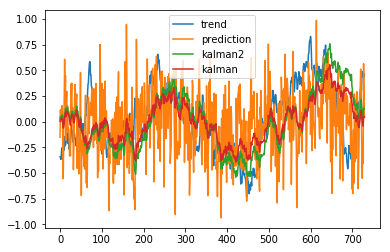

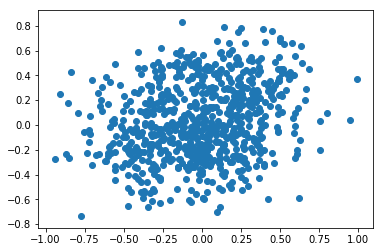

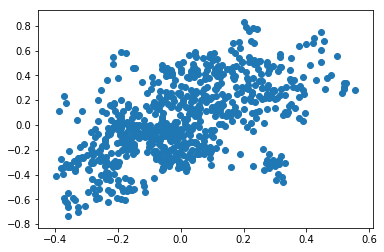

-3.646565337991343


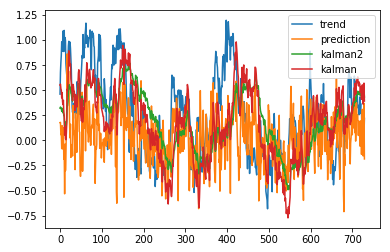

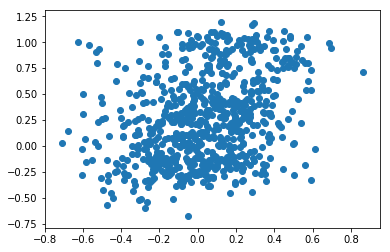

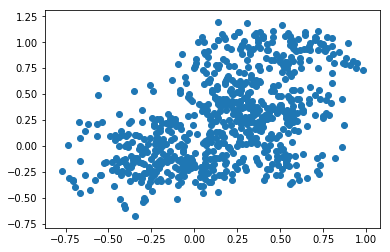

-3.6465719592291874


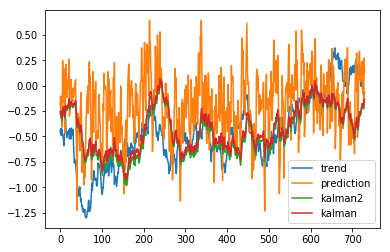

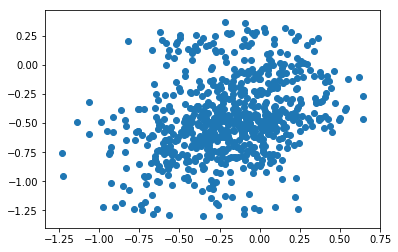

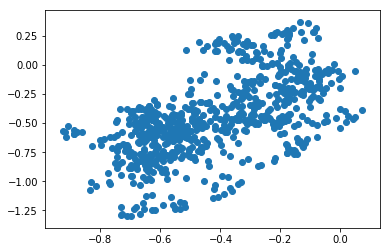

-3.646584581444041


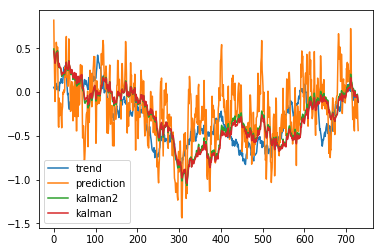

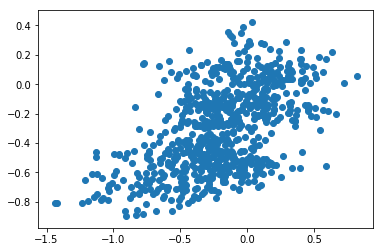

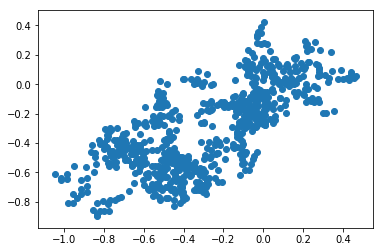

-3.646540270280094


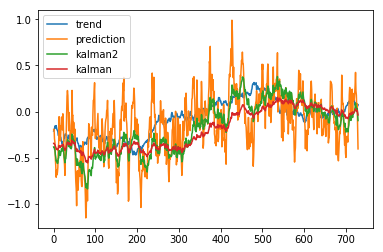

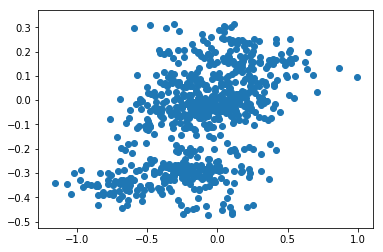

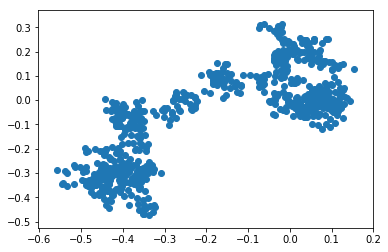

-3.646615968877451


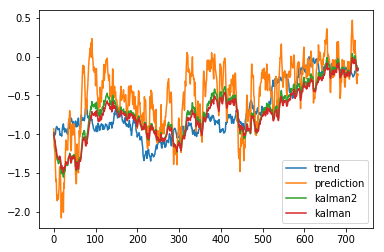

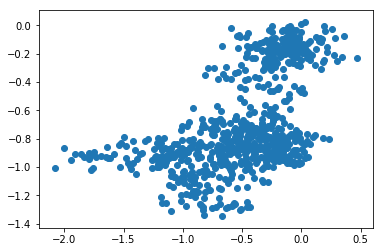

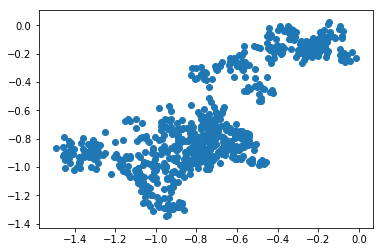

-3.6464529827702803


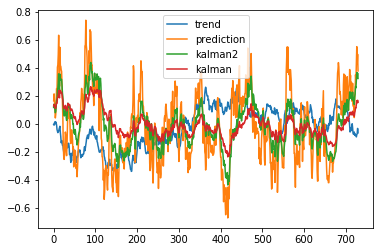

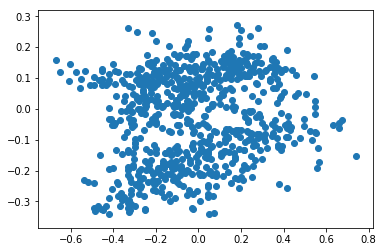

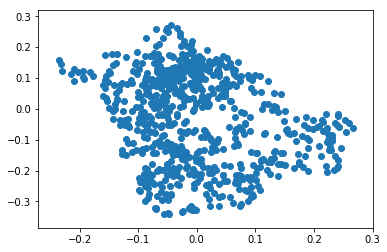

-3.646589368907736


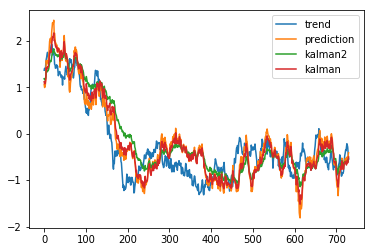

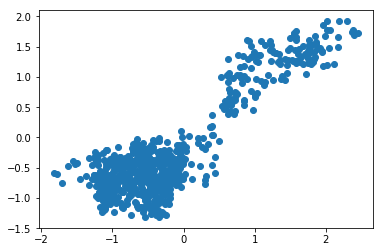

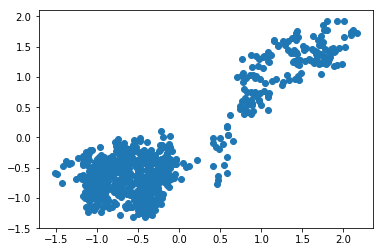

-3.646534979902209


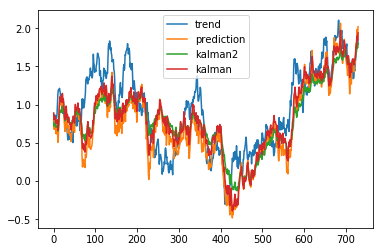

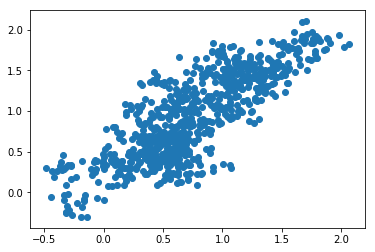

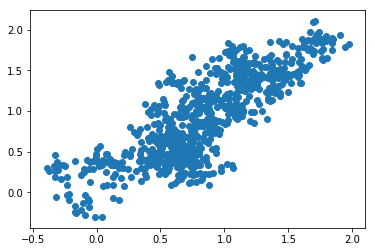

-3.6464216842781765


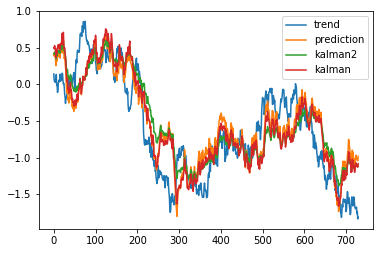

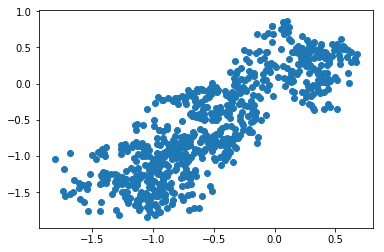

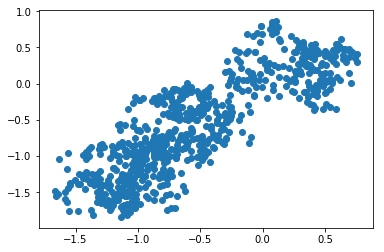

-3.6466737914364797


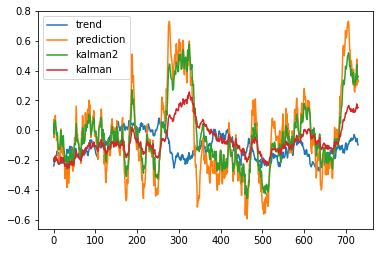

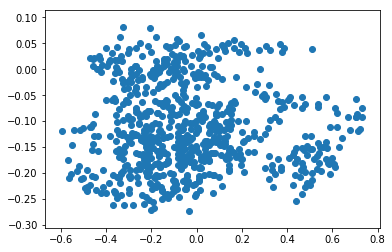

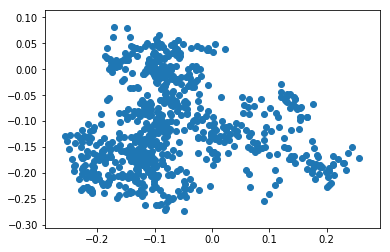

-3.646578748803587


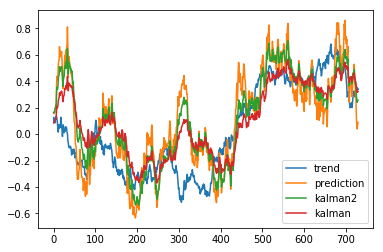

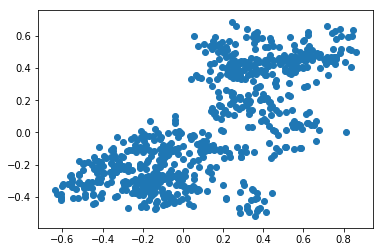

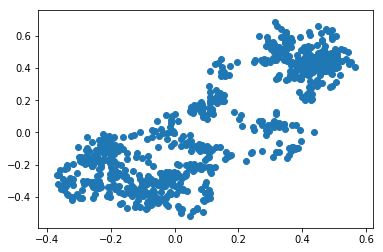

-3.6466724796686334


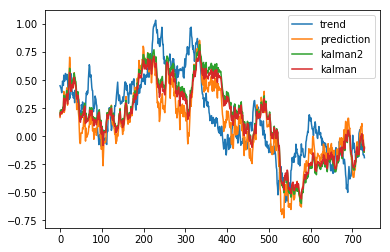

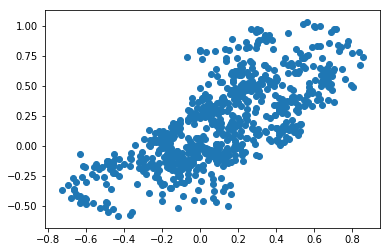

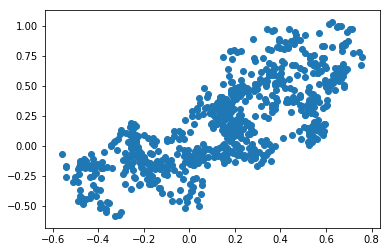

-3.6466205819509936


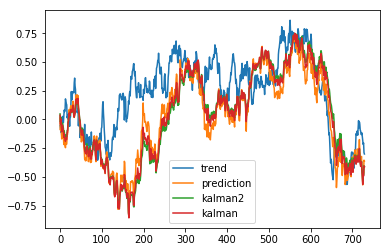

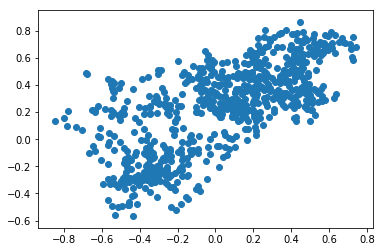

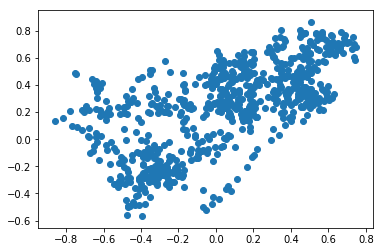

-3.646635923162104


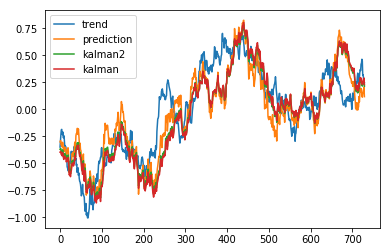

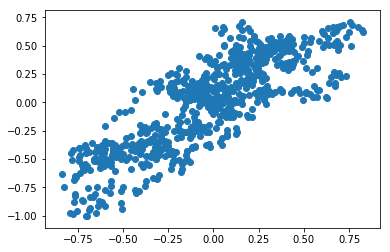

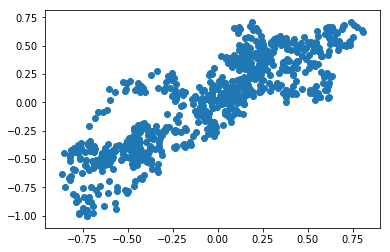

-3.646312253875659


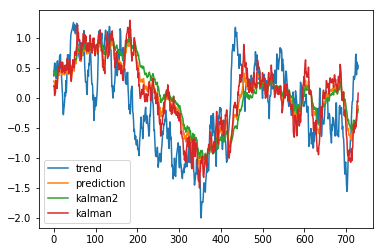

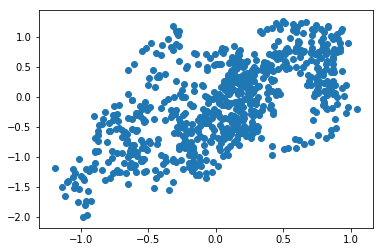

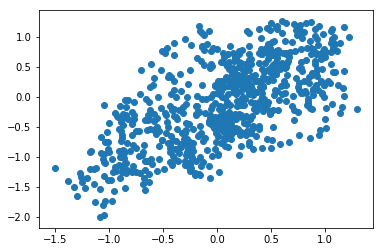

-3.646507168048994


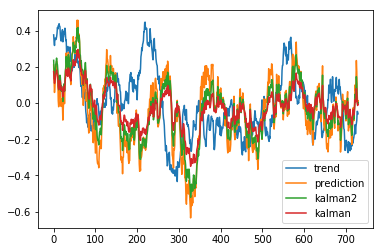

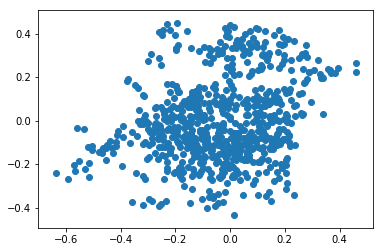

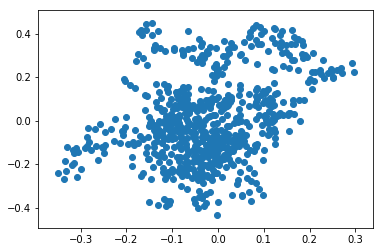

-3.646635131770746


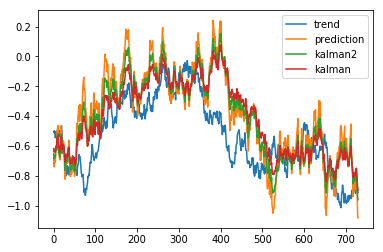

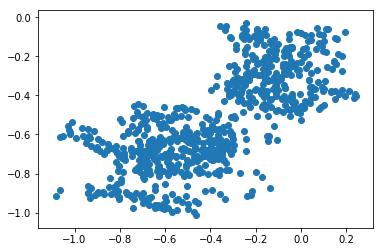

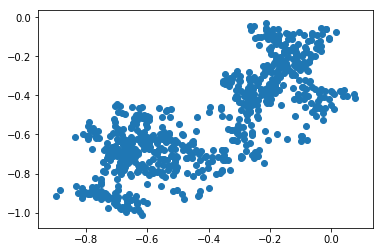

-3.64657059274614


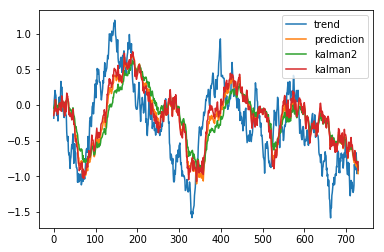

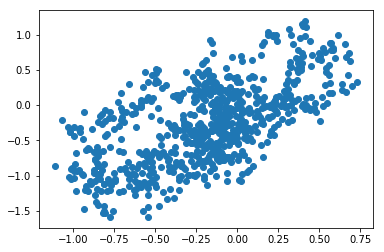

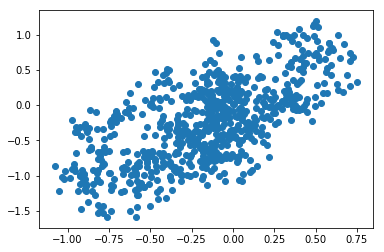

-3.646620369376616


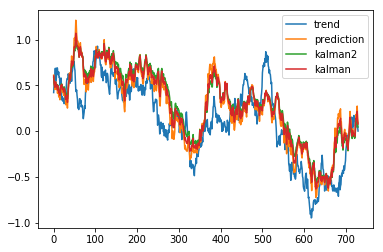

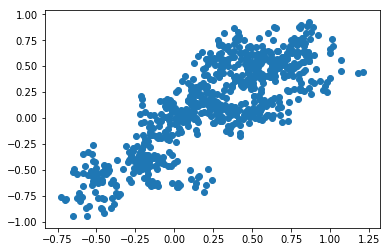

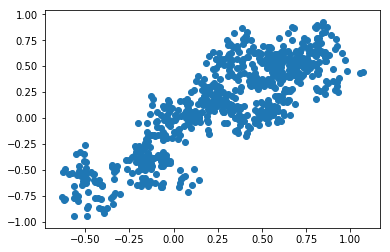

-3.646468752389775


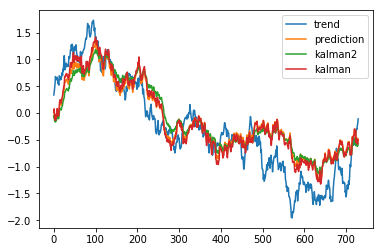

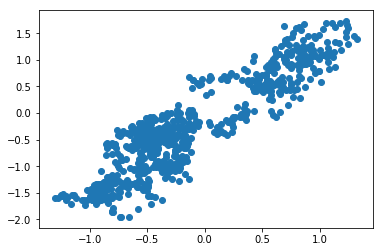

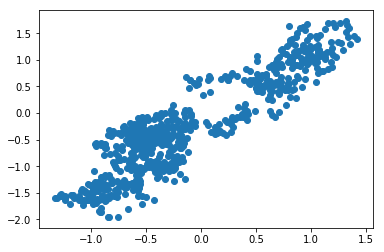

-3.6465850450098527


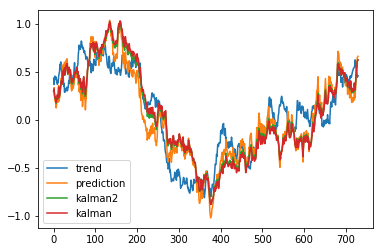

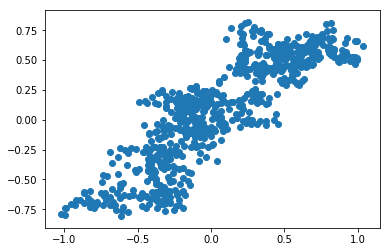

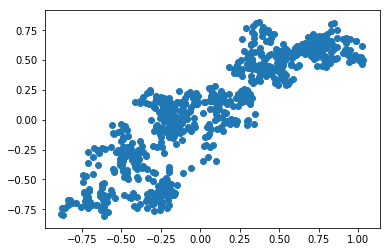

-3.646658518444748


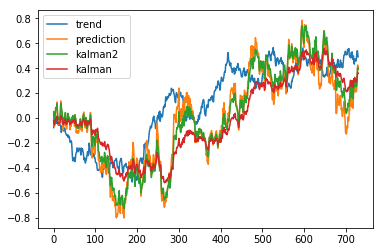

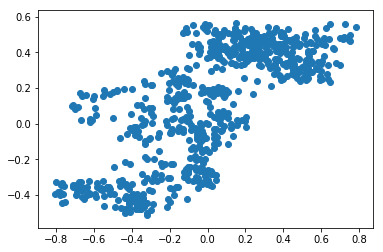

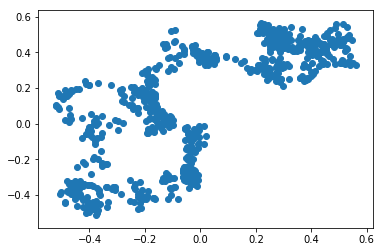

-3.6466349445749087


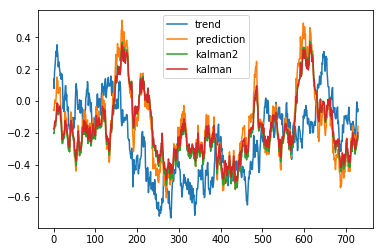

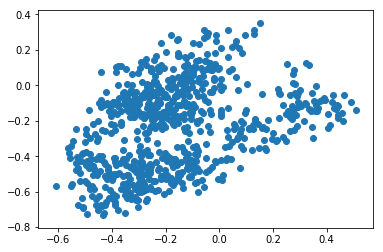

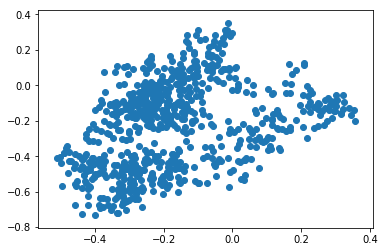

-3.6465922867413623


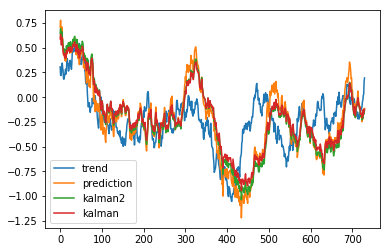

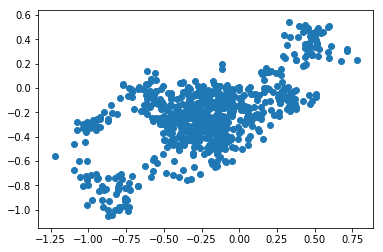

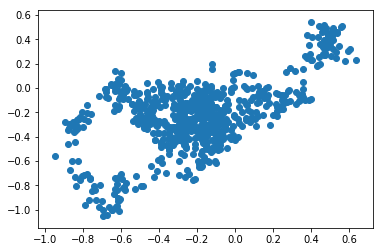

-3.6466071175877017


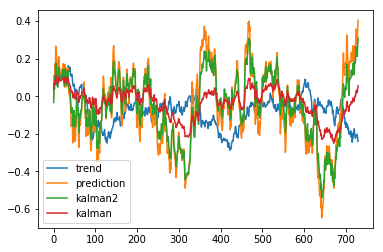

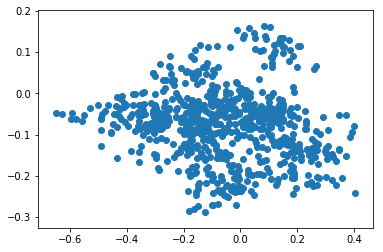

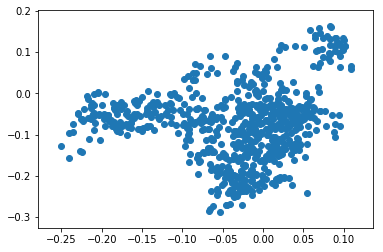

-3.646558297192679


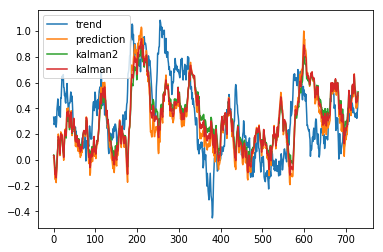

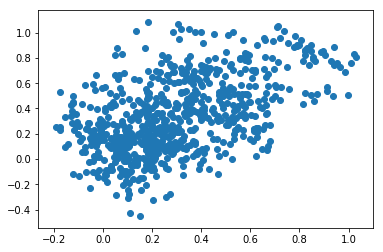

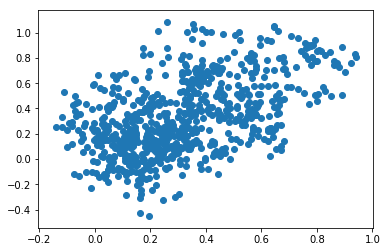

-3.646711806394161


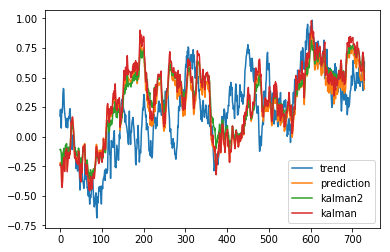

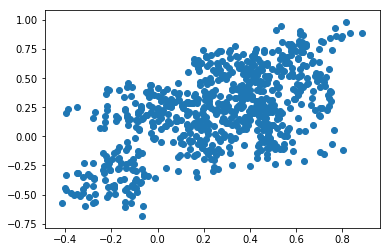

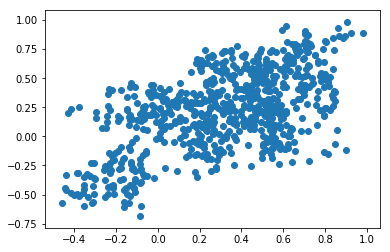

-3.646311585651712


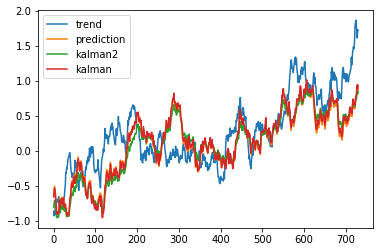

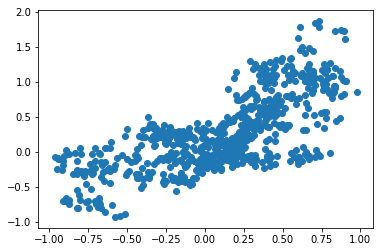

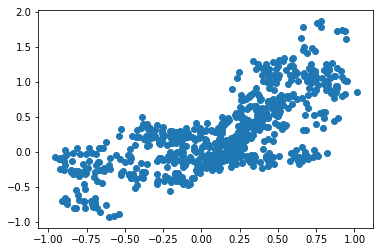

-3.646658065123485


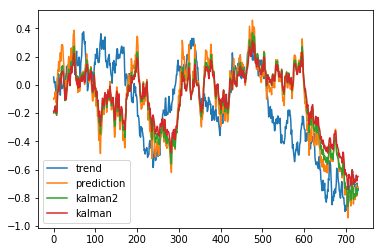

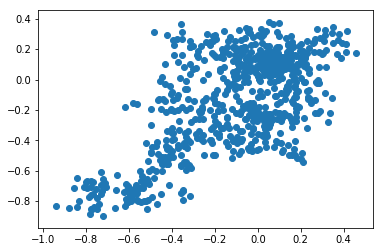

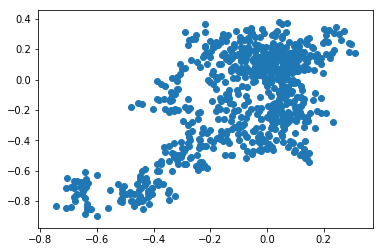

-3.6465118172112865


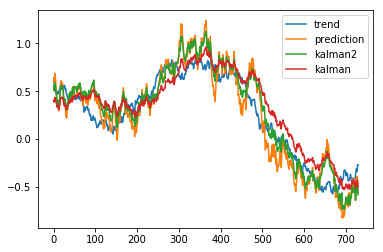

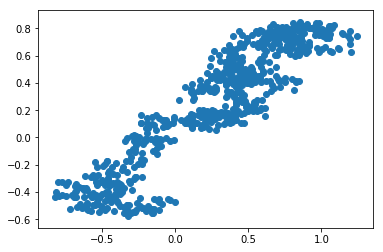

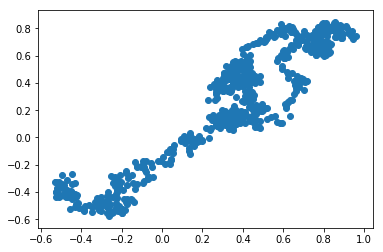

-3.6466892381198717


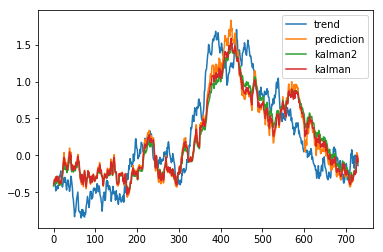

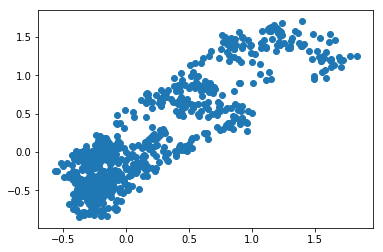

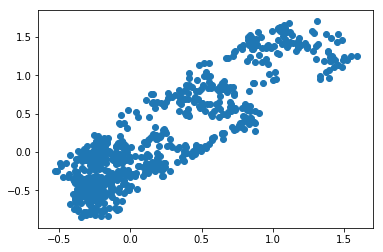

-3.6465152710210544


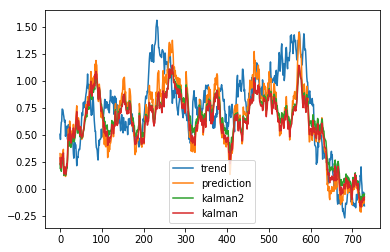

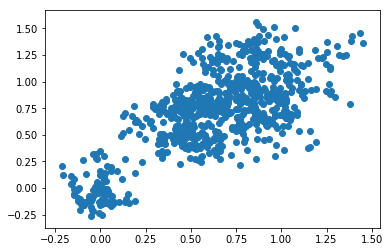

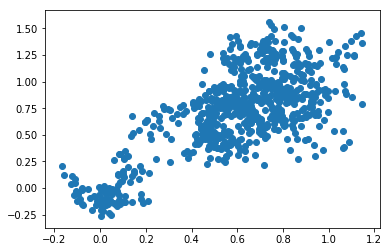

-3.6464454215951276


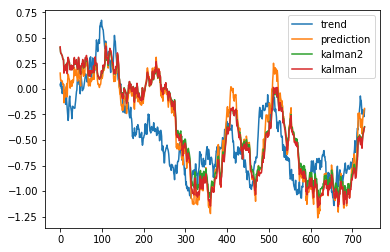

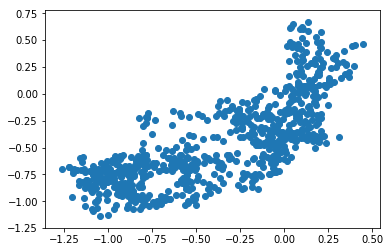

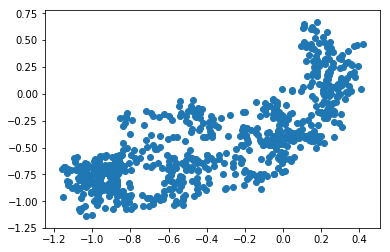

-3.646597977122293


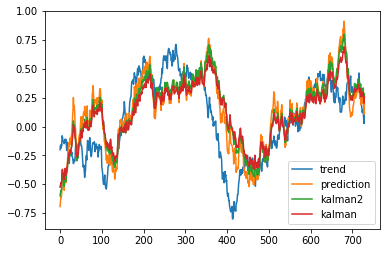

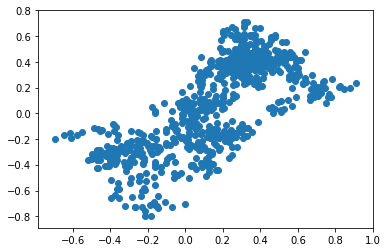

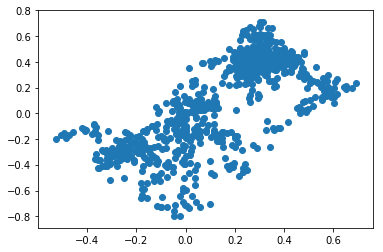

-3.646543026296423


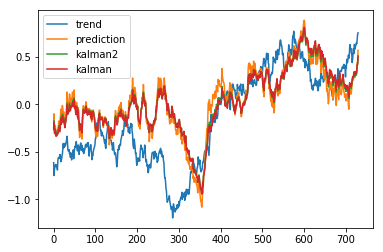

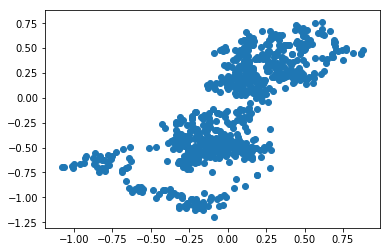

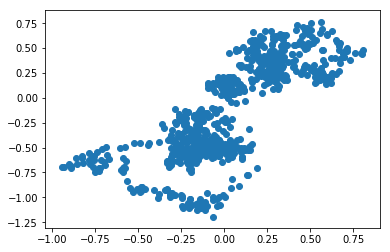

-3.646619475539775


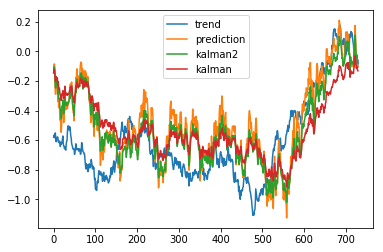

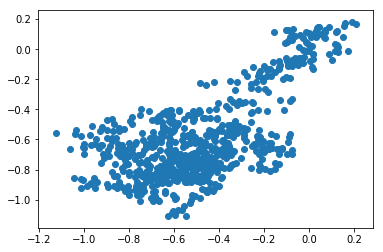

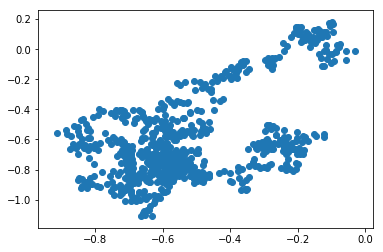

-3.6465572692453874


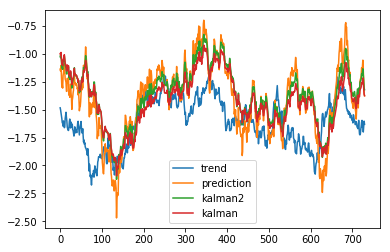

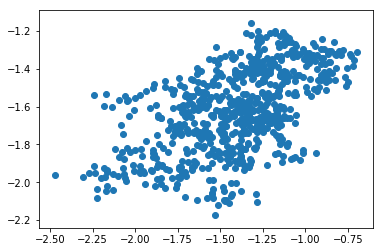

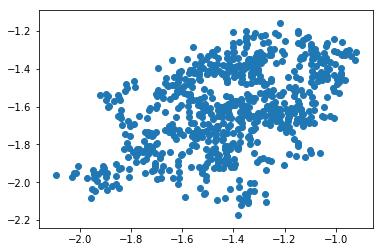

-3.646563146123664


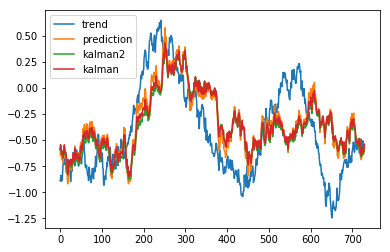

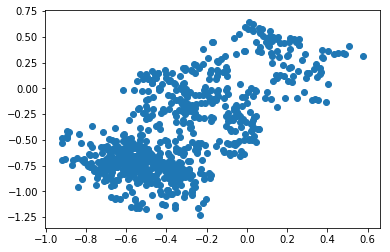

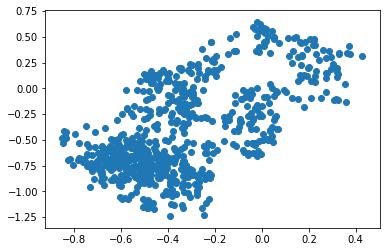

-3.6464907919056726


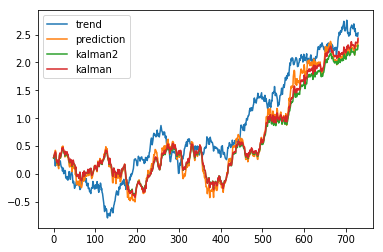

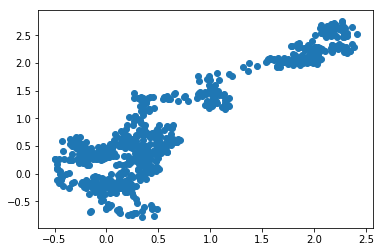

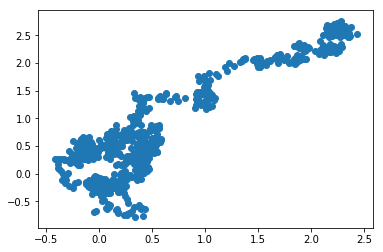

-3.6466295948252094


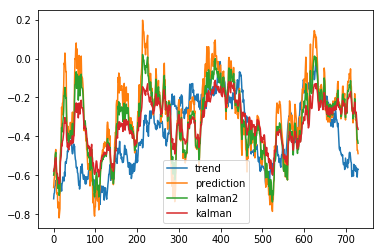

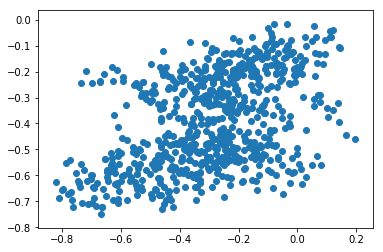

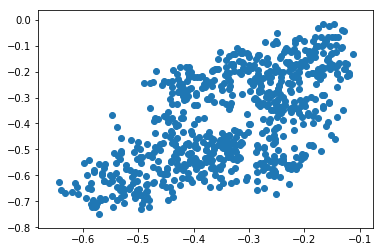

-3.6467132625170064


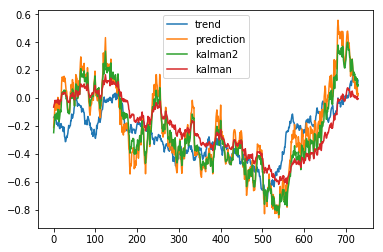

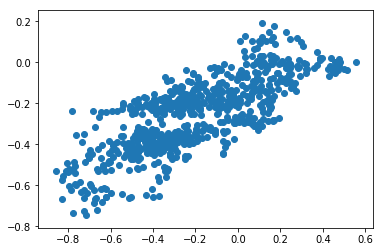

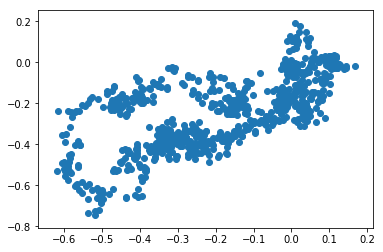

-3.6463367267046136


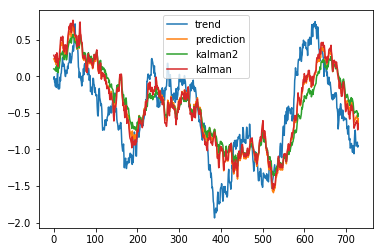

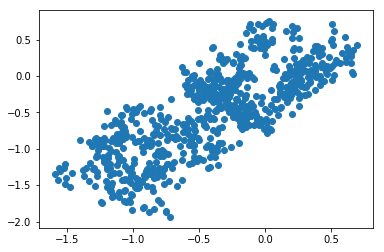

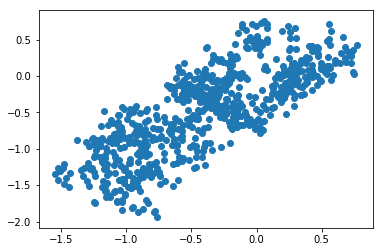

-3.6465449501760316


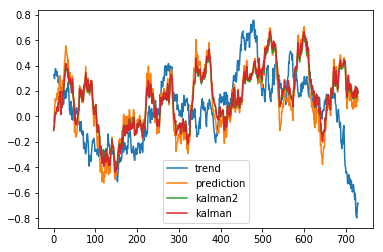

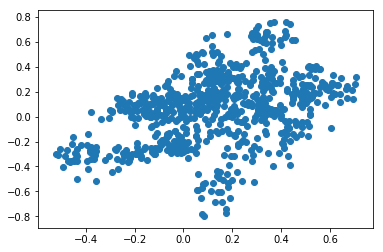

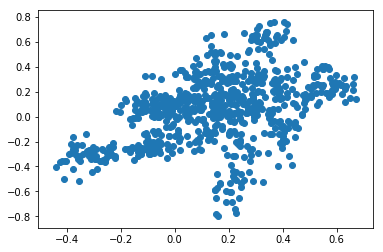

-3.646641063364224


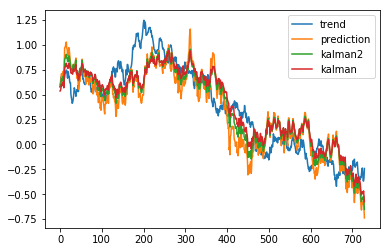

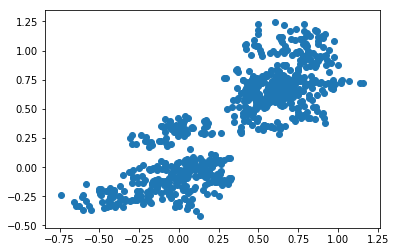

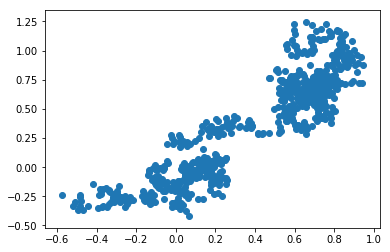

-3.646636639116333


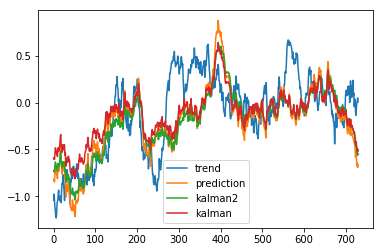

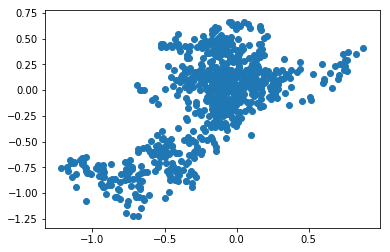

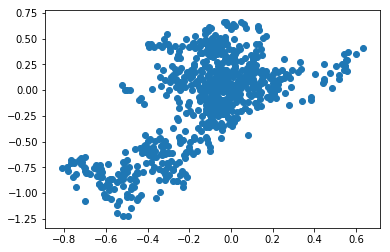

-3.6466583366040153


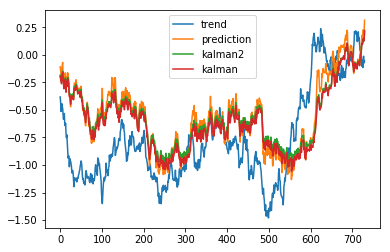

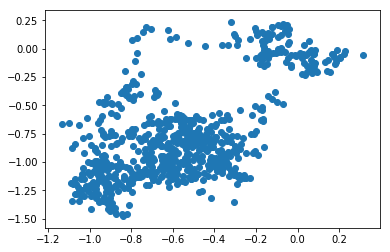

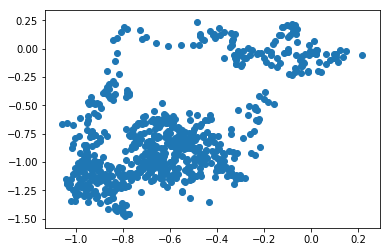

-3.64654386076145


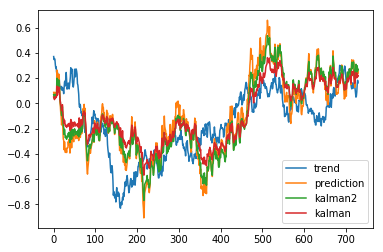

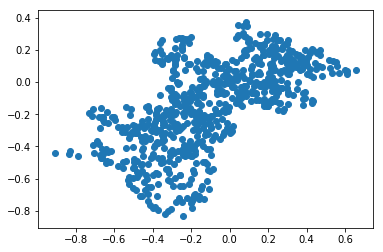

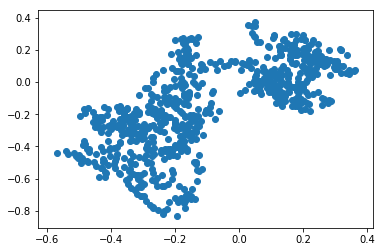

-3.646602137340234


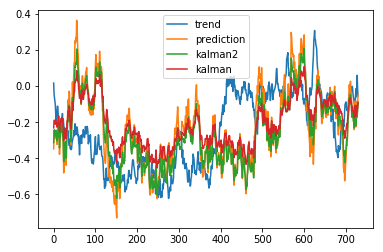

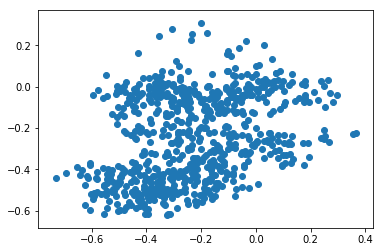

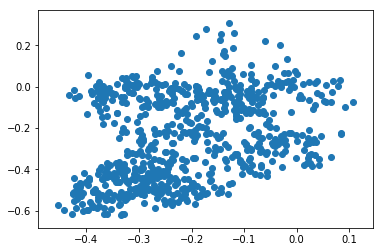

-3.6465384118258966


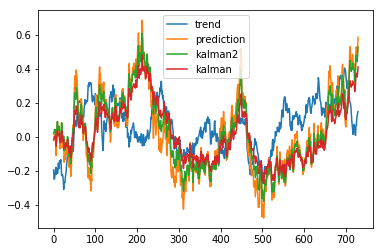

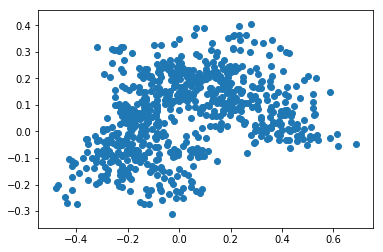

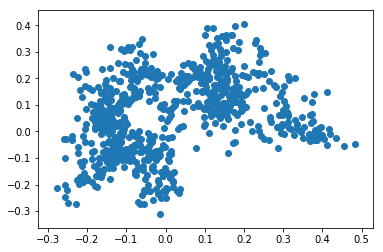

-3.646606214437635


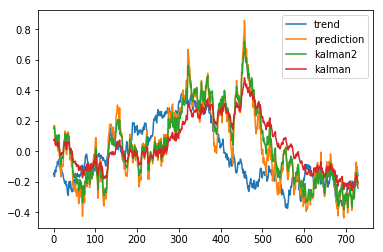

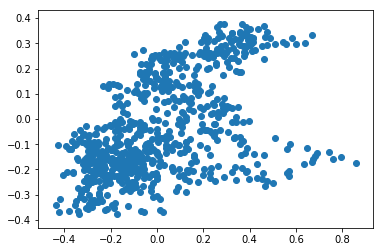

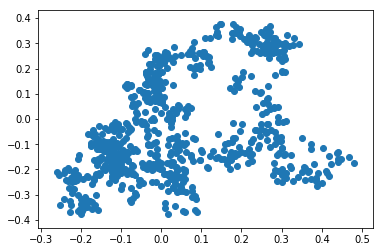

-3.6467311494983745


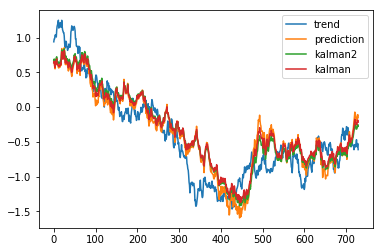

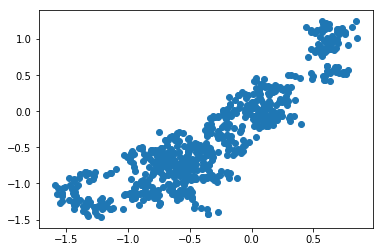

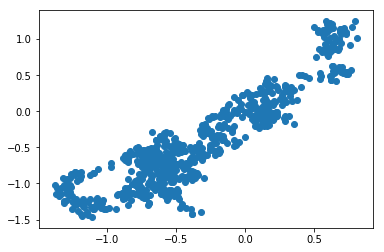

-3.646563775930555


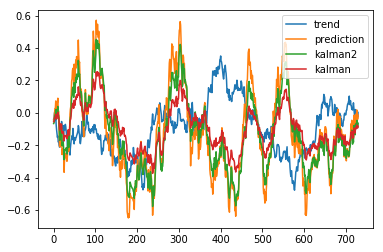

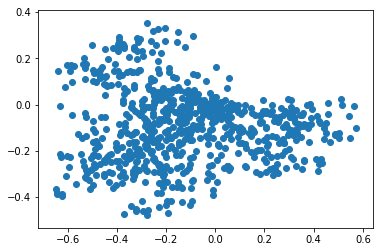

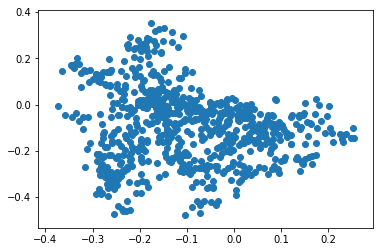

-3.6464204682037247


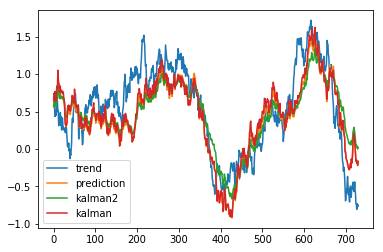

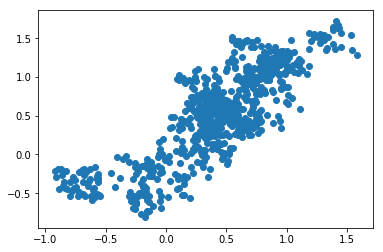

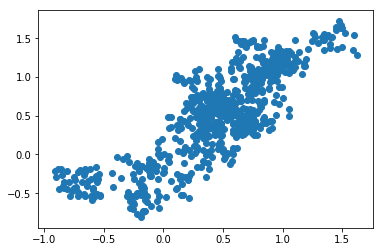

-3.6466069438960416


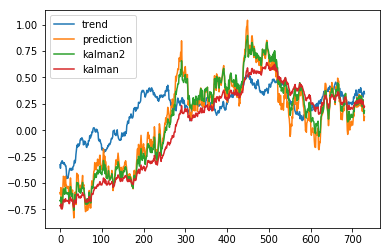

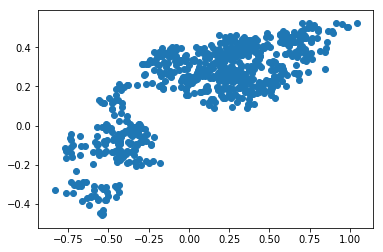

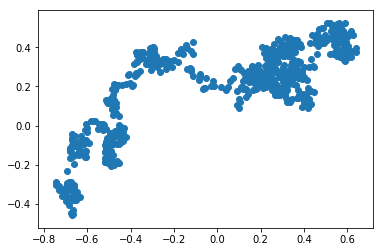

-3.6467095265164984


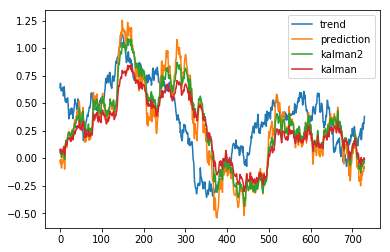

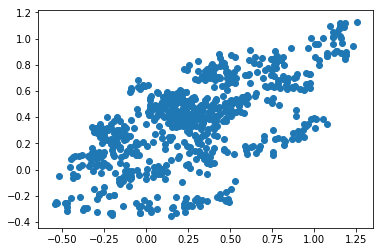

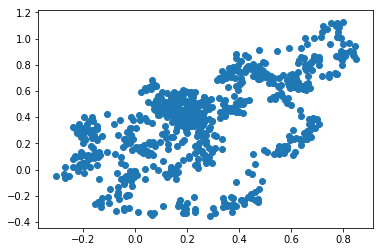

-3.6463946042116744


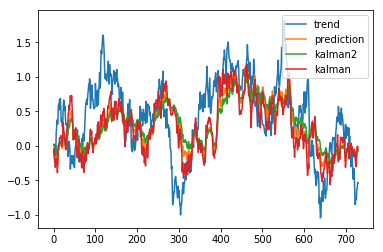

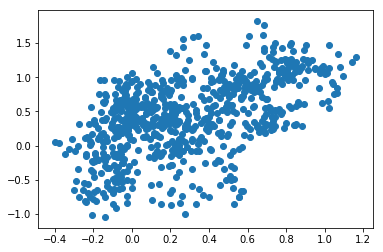

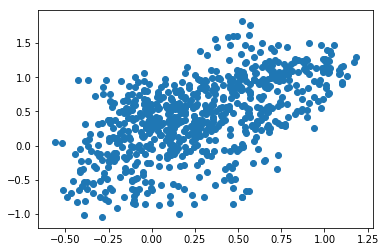

-3.646561523759739


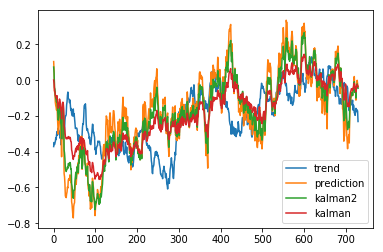

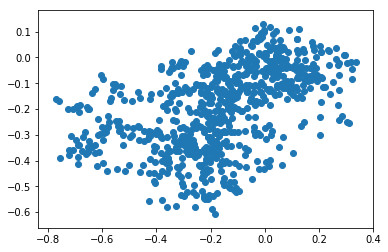

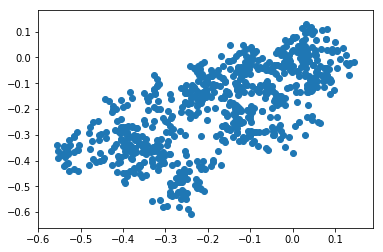

-3.6466400861740125


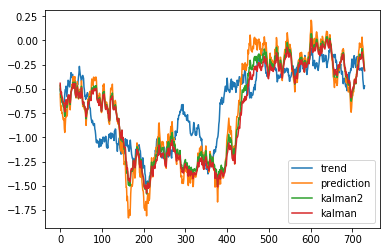

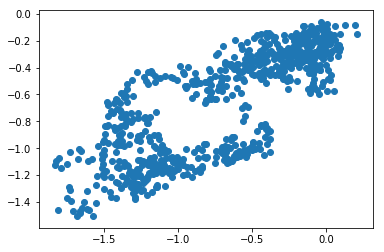

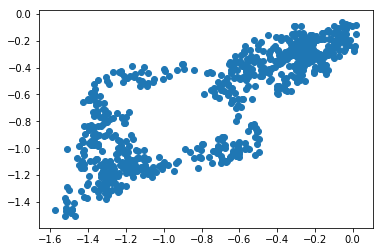

-3.6465410260483635


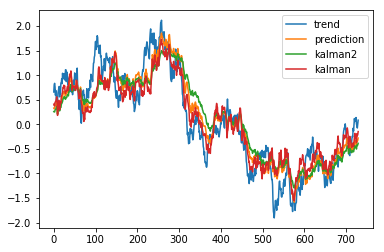

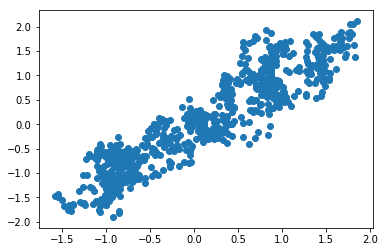

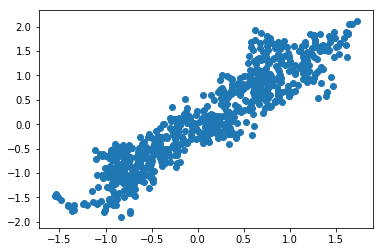

-3.64653656105511


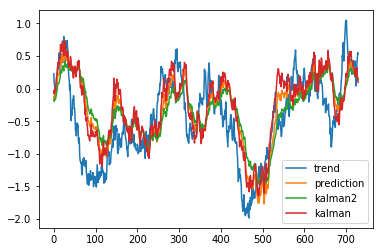

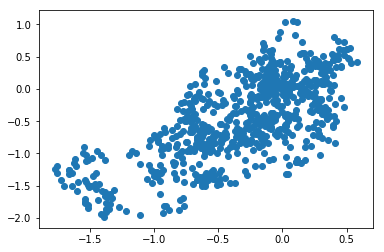

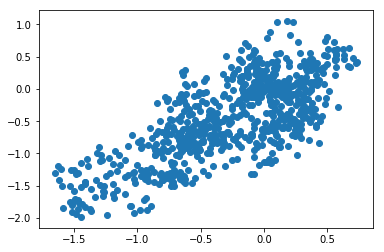

-3.6465316324960453


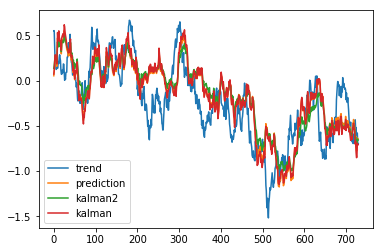

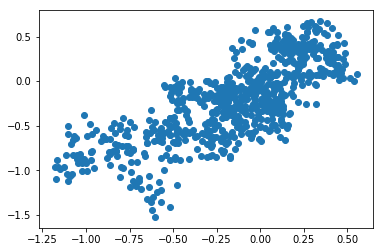

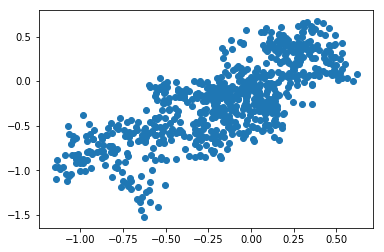

-3.6465908268932266


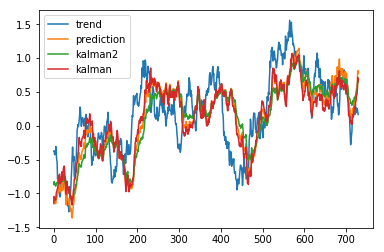

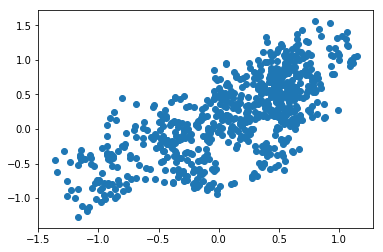

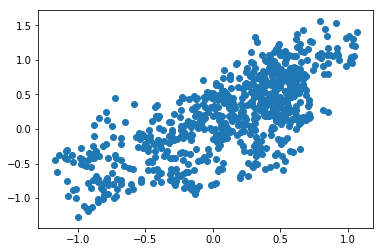

-3.6464853441342724


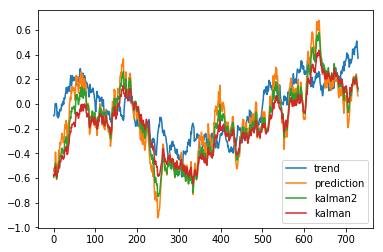

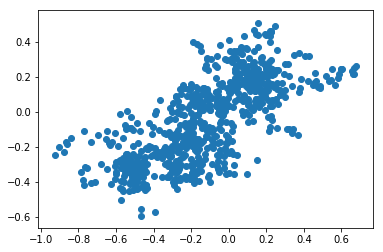

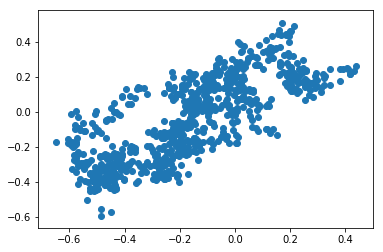

-3.6466095203999442


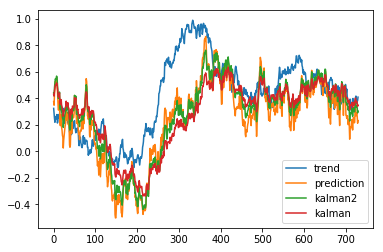

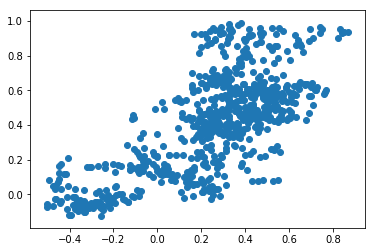

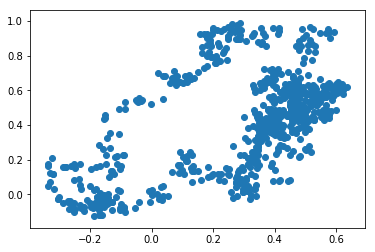

-3.6464491499122245


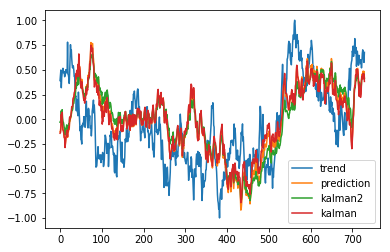

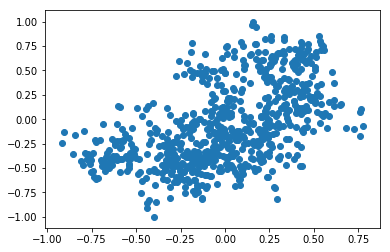

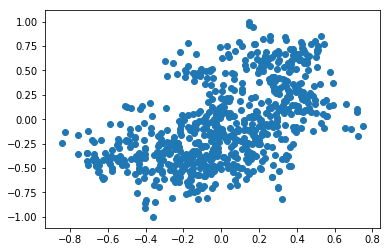

-3.646512995567174


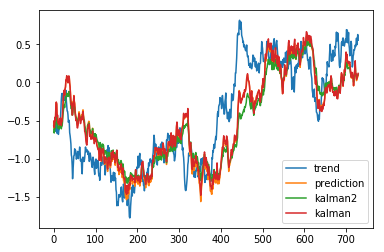

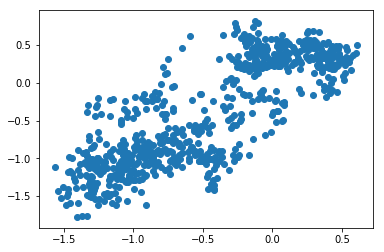

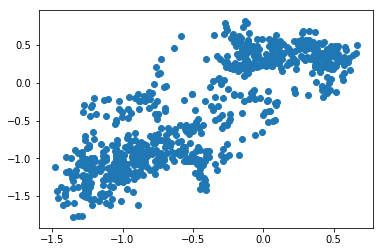

-3.646460788417609


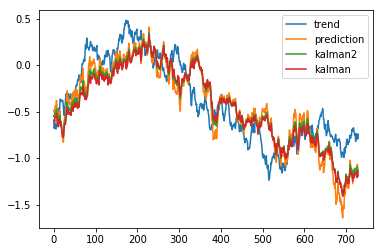

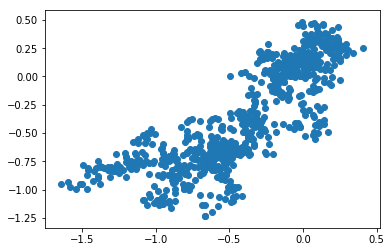

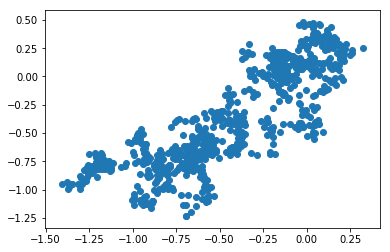

-3.6466049774084253


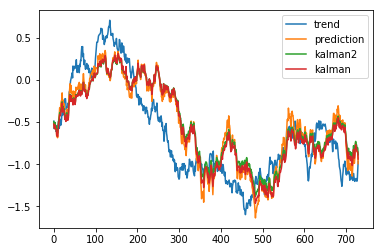

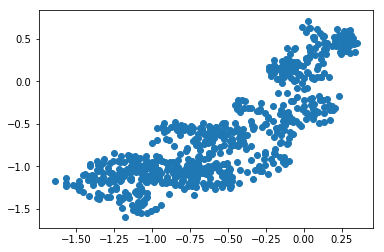

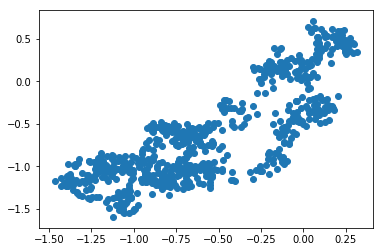

-3.6466362030245376


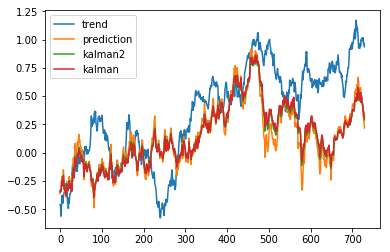

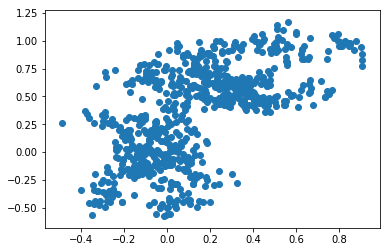

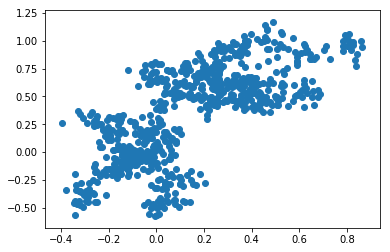

-3.646519799809904


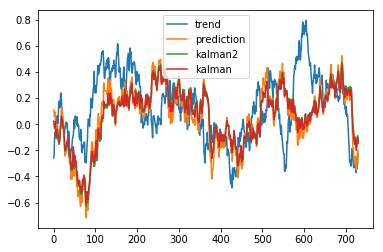

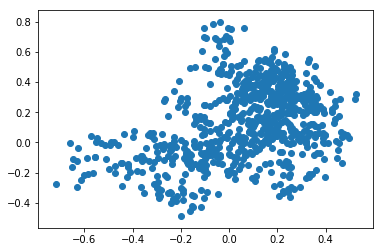

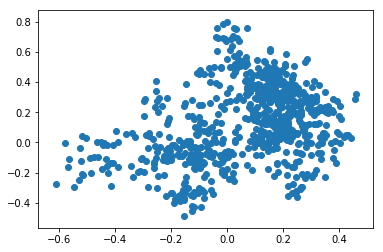

-3.6464269238989813


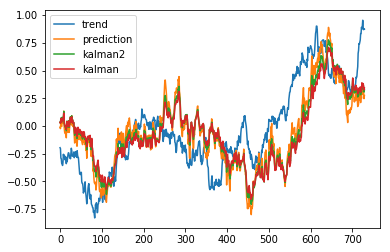

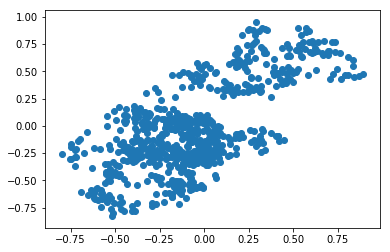

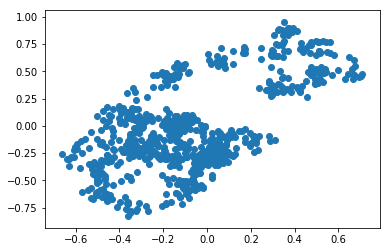

-3.646497184969486


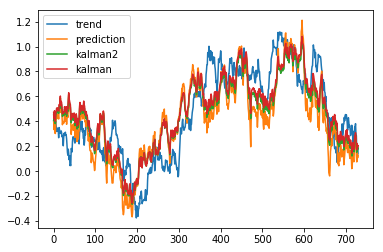

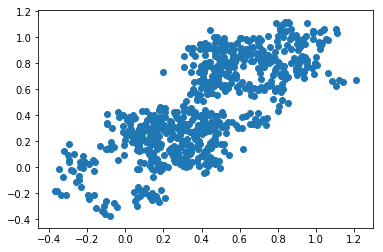

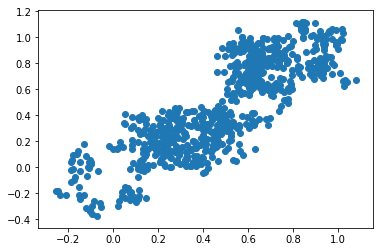

-3.646581958141179


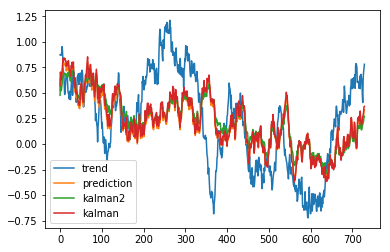

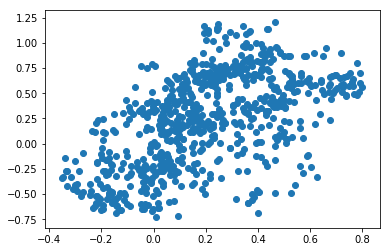

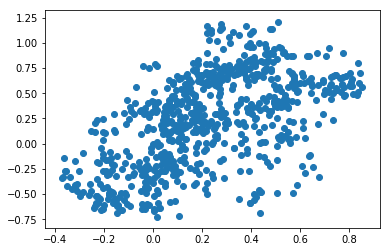

-3.646500947745518


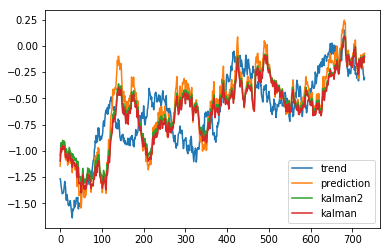

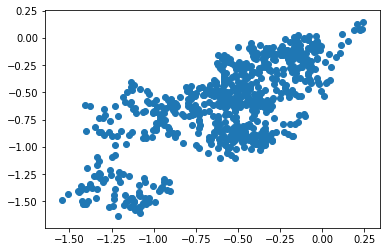

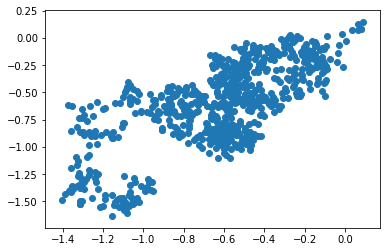

-3.6464932936709387


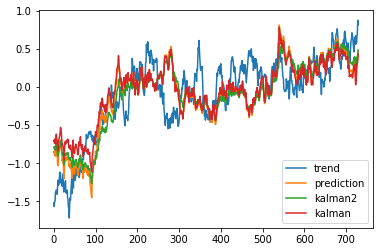

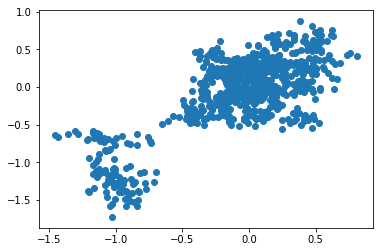

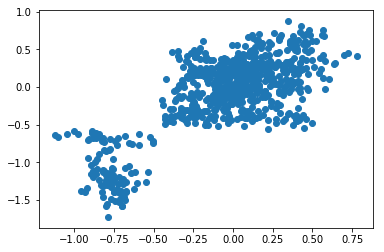

-3.646529643191026


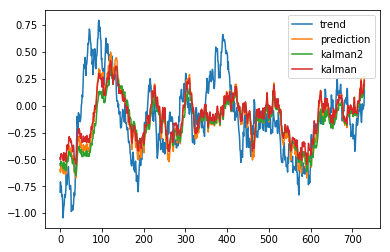

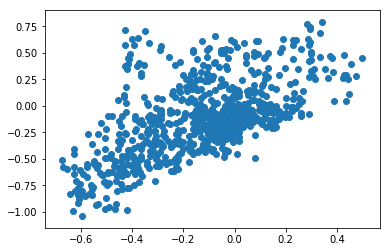

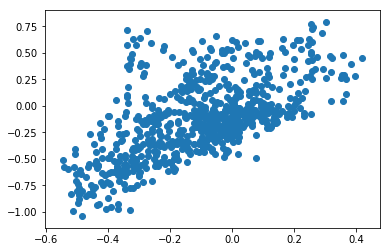

-3.64666286003776


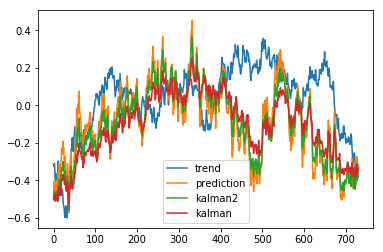

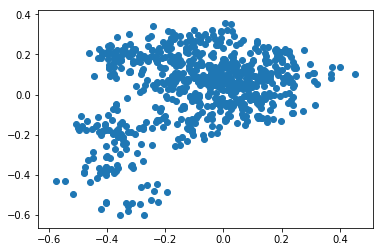

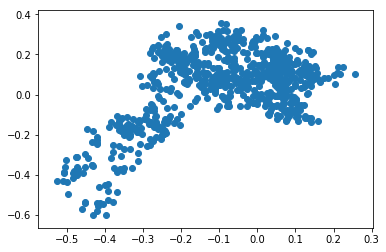

-3.6466092058457447


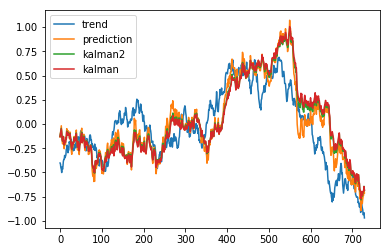

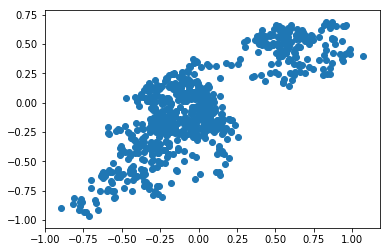

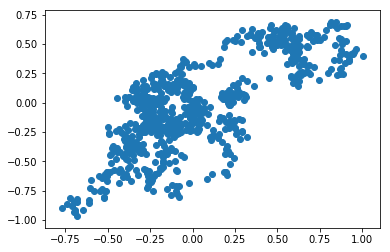

-3.6466071967501206


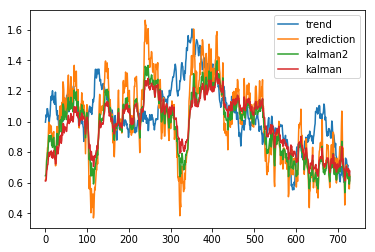

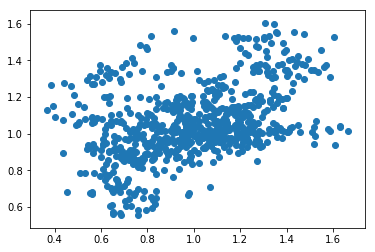

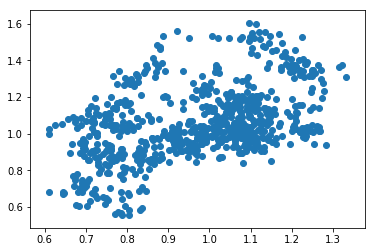

-3.6465828864369554


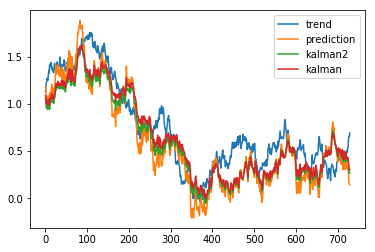

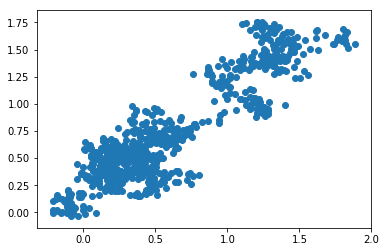

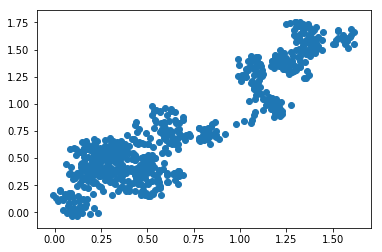

-3.646608952060343


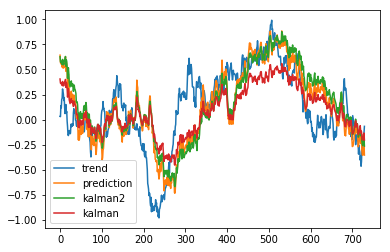

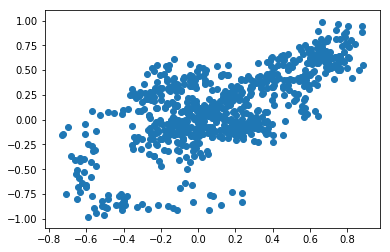

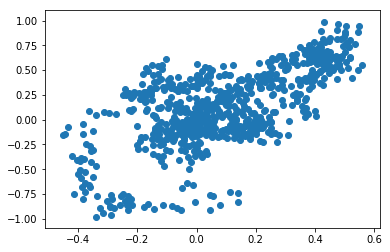

-3.646578566497193


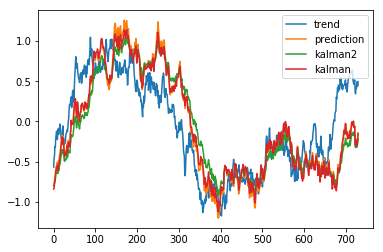

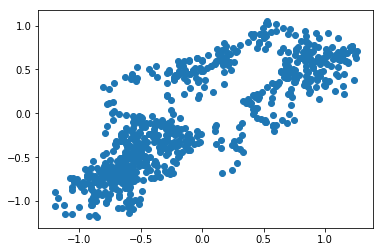

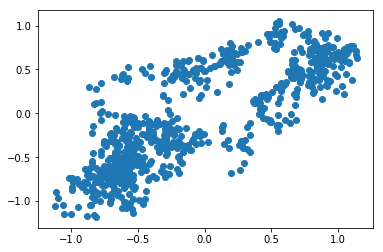

-3.6466433662921203


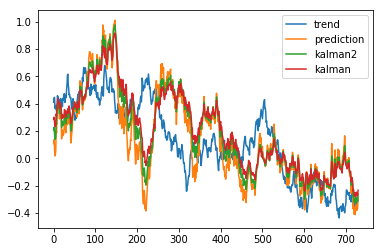

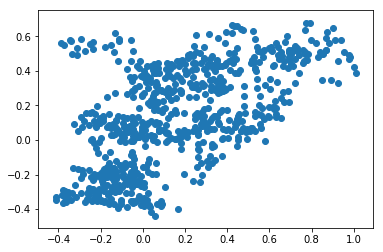

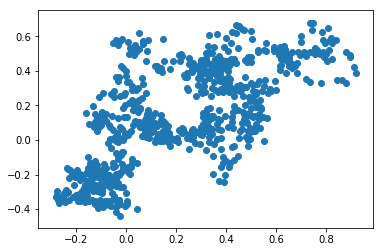

-3.646630516368897


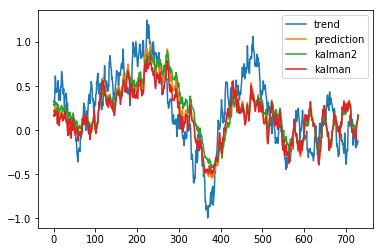

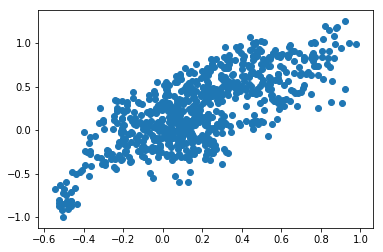

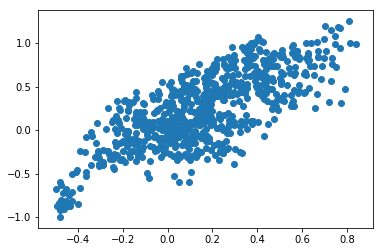

-3.646497862506659


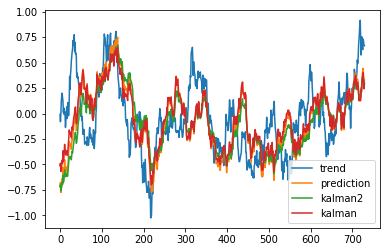

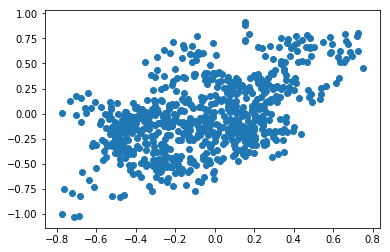

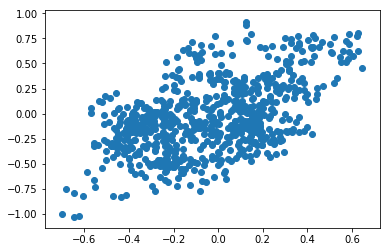

-3.6466344363056136


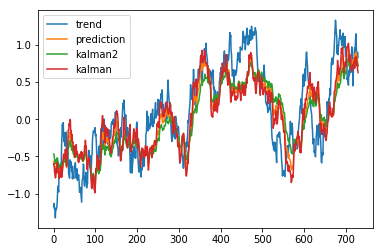

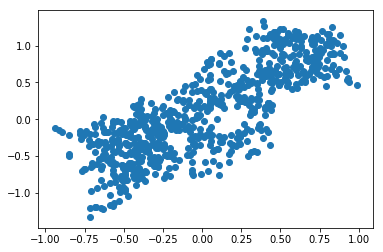

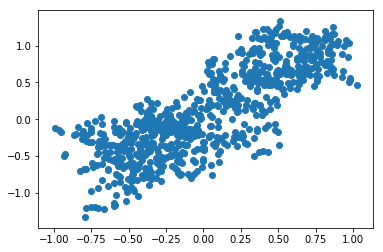

-3.6465604303870363


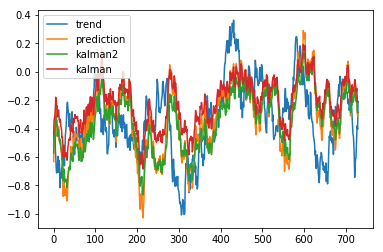

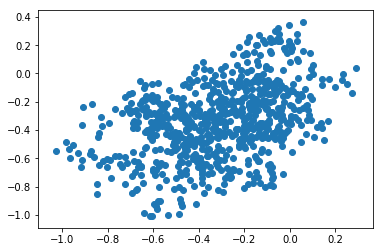

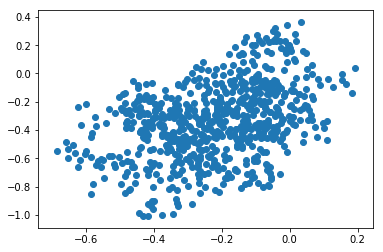

-3.646705916710199


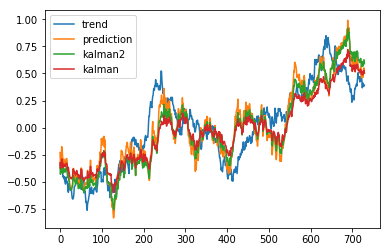

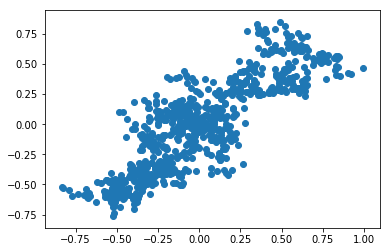

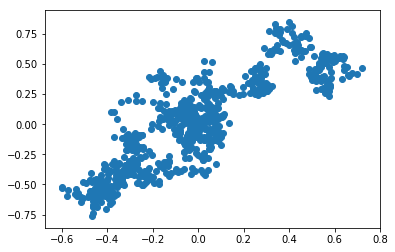

-3.64657265469432


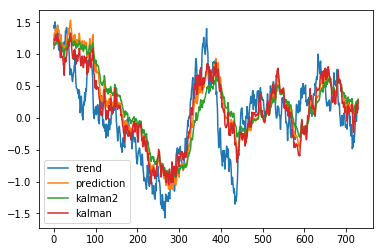

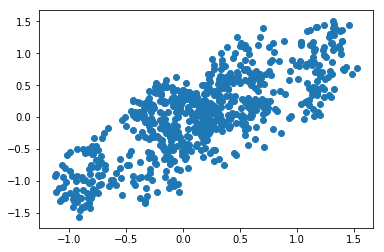

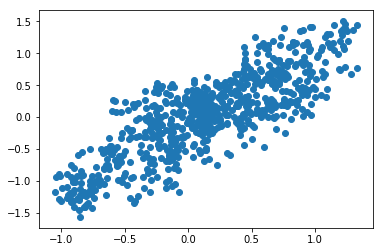

-3.6465625535696757


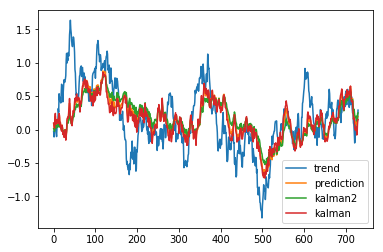

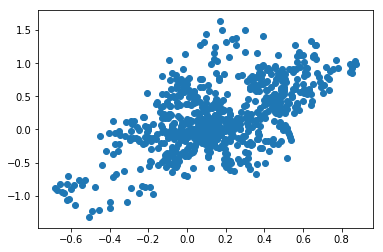

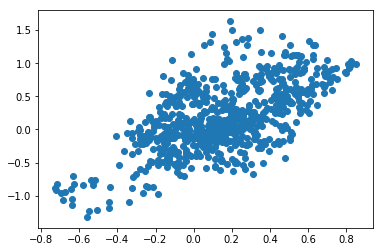

-3.646710223145784


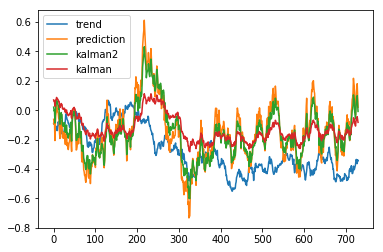

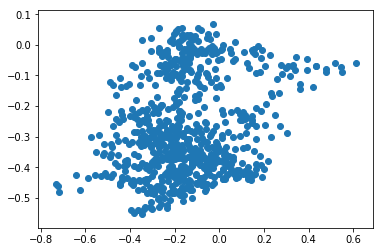

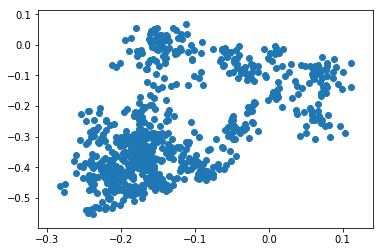

-3.646633867500351


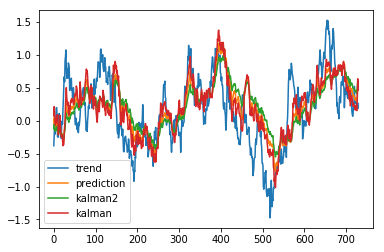

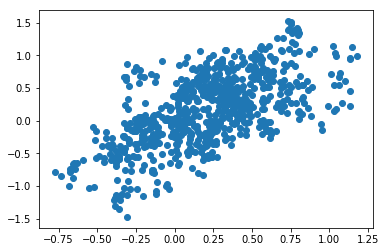

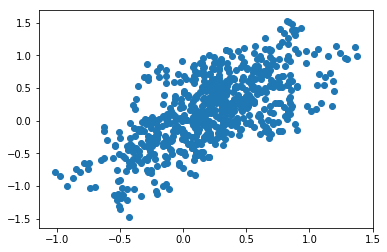

-3.646576062869282


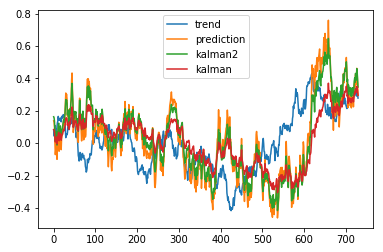

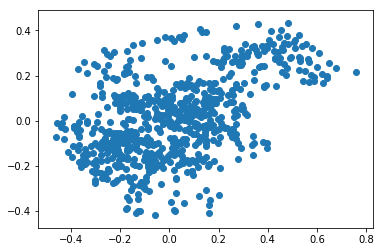

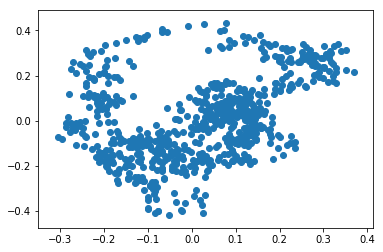

-3.6465722237247986


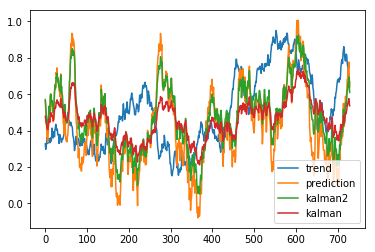

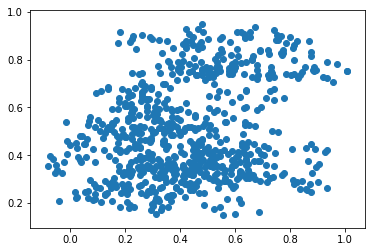

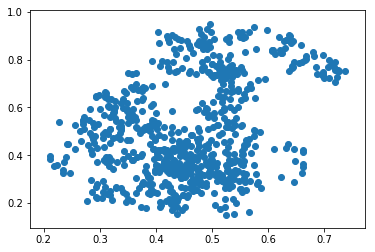

-3.6461982883978648


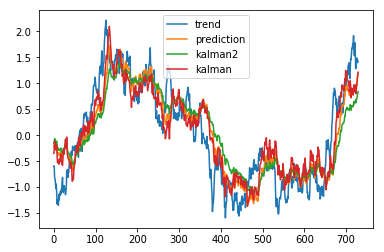

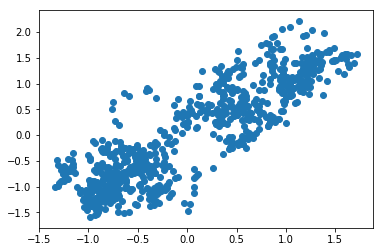

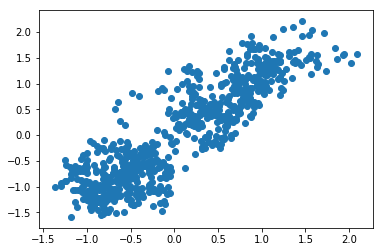

-3.646526393340902


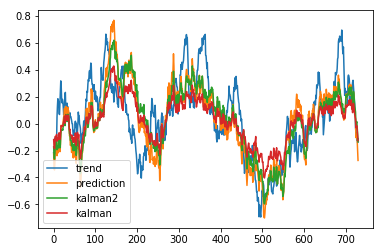

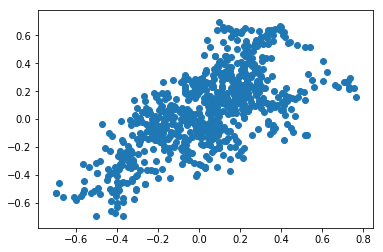

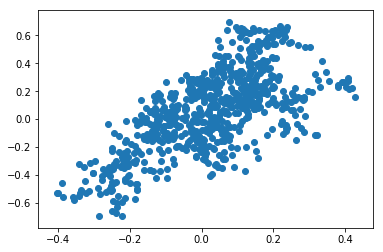

-3.646749022509904


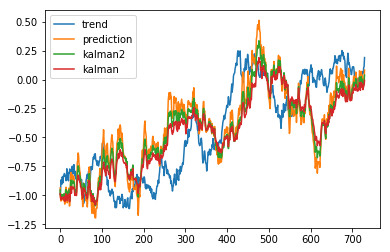

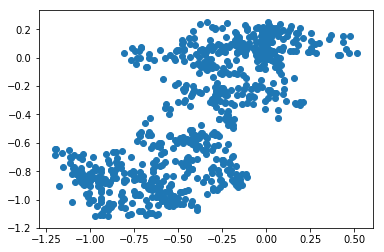

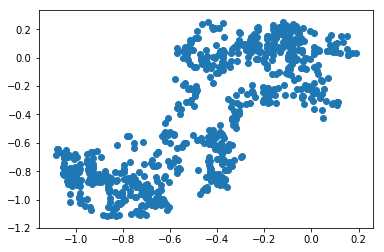

-3.646610240545125


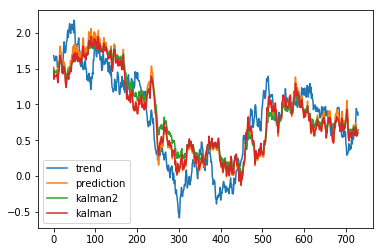

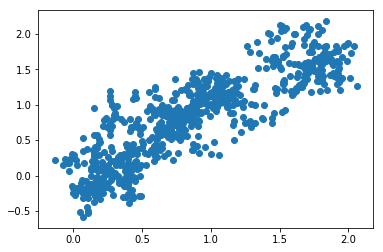

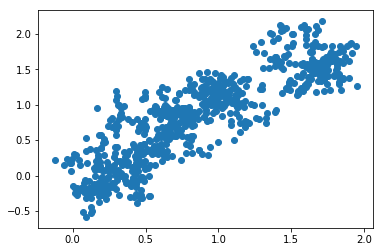

-3.6466570297256125


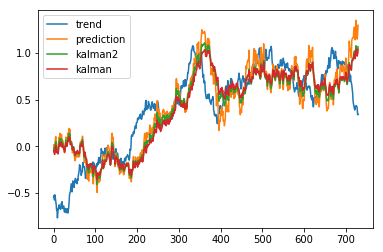

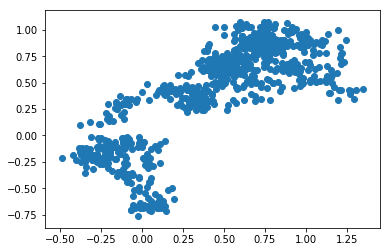

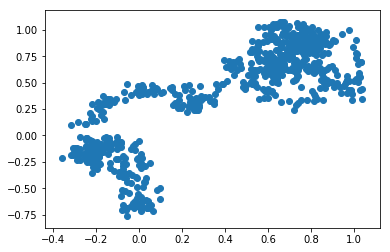

-3.6467227203305823


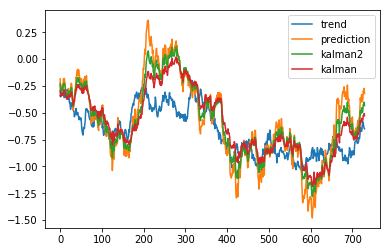

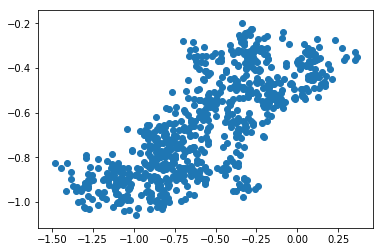

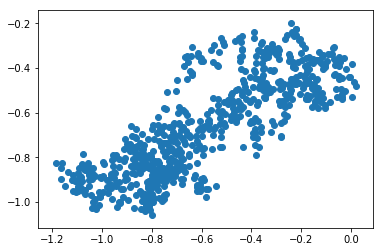

-3.6455148301087332


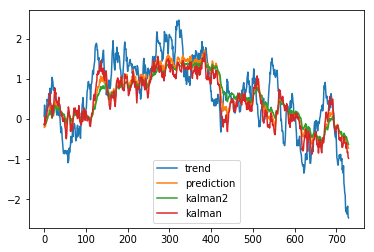

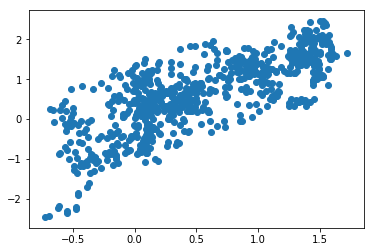

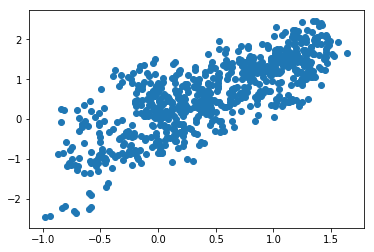

-3.646680451324211


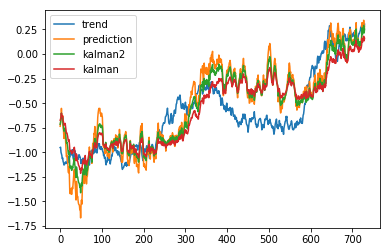

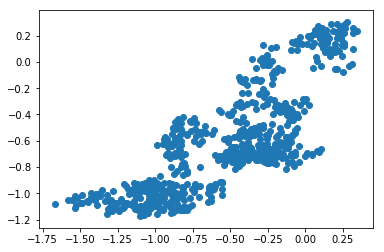

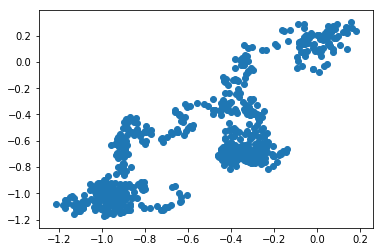

-3.646548673603685


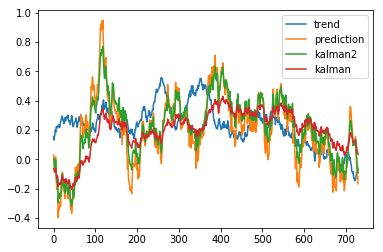

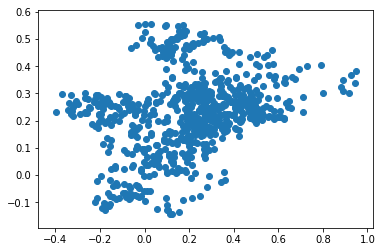

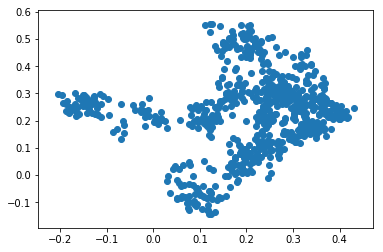

-3.646483583003284


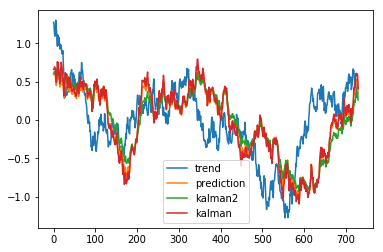

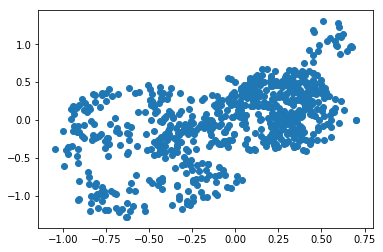

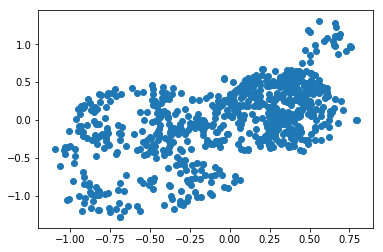

-3.6463908961508436


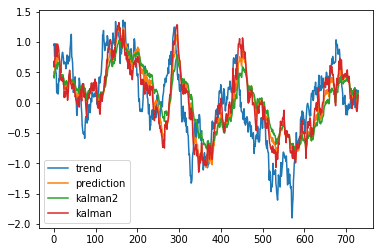

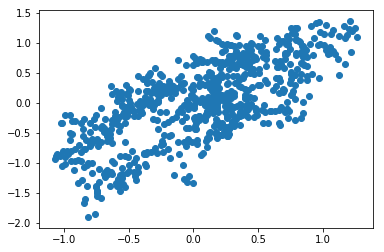

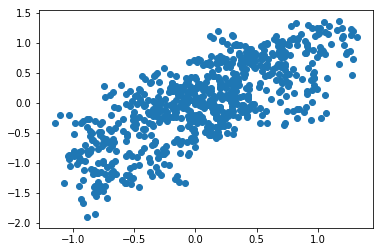

-3.646648925589399


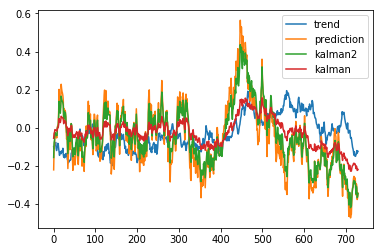

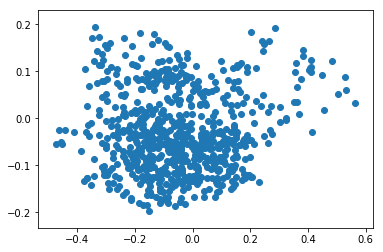

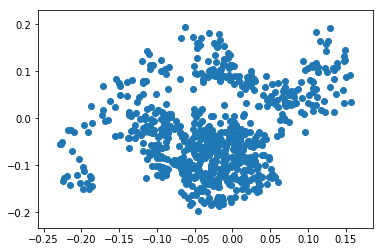

-3.6465907922014607


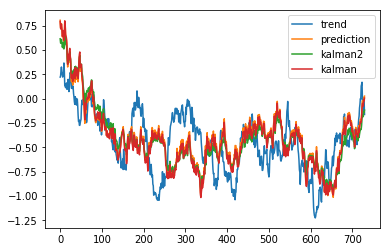

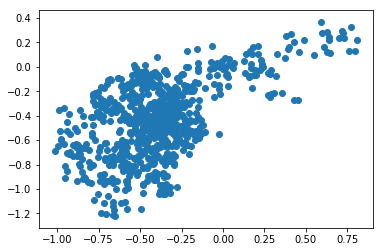

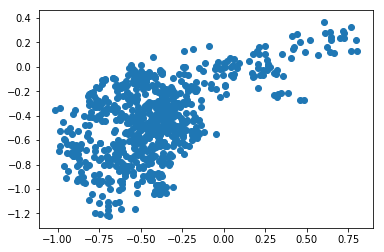

-3.6465722288470728


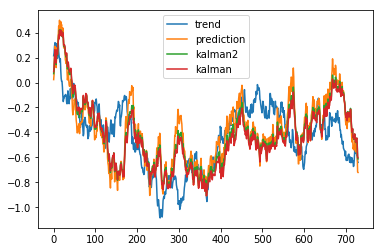

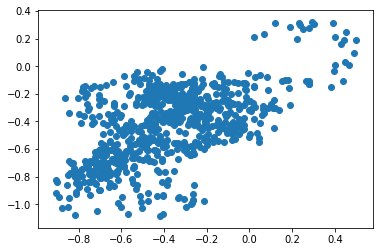

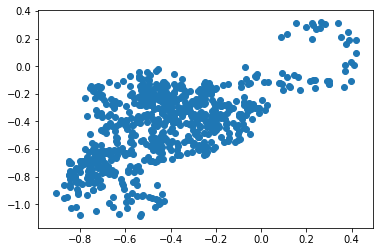

-3.646619391953574


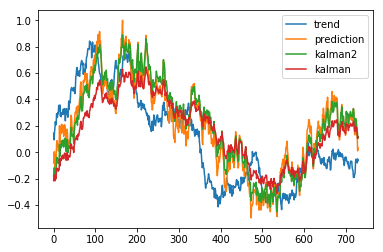

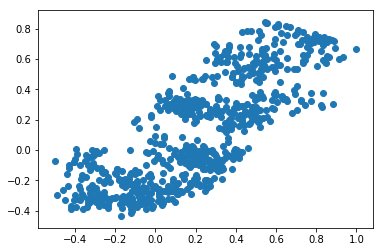

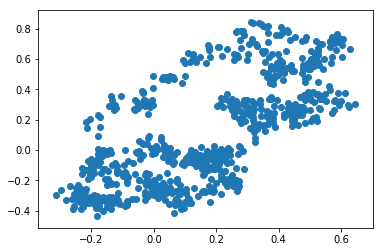

-3.6466490766964865


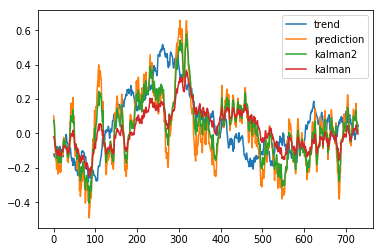

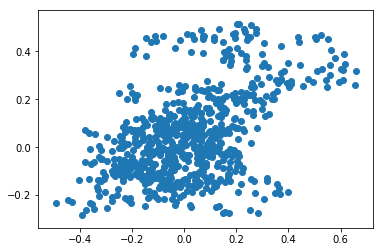

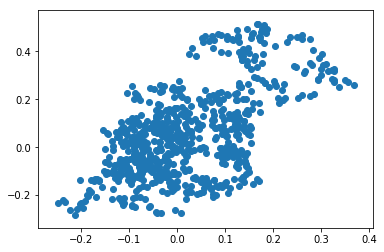

-3.646650390326978


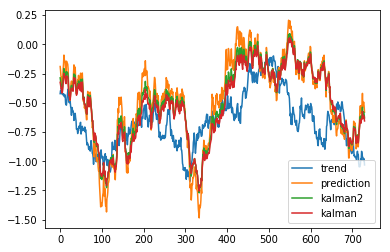

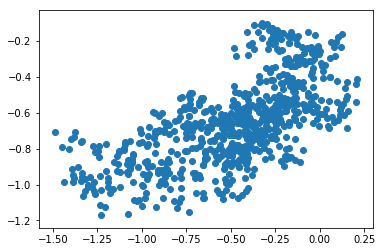

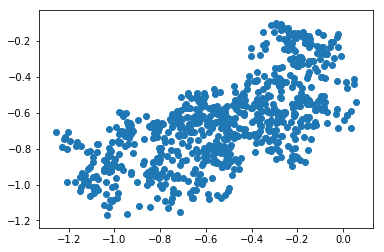

-3.6467257187236113


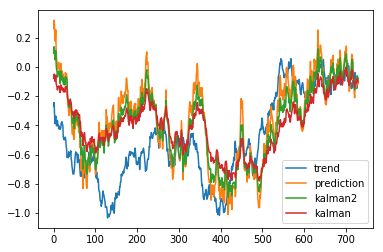

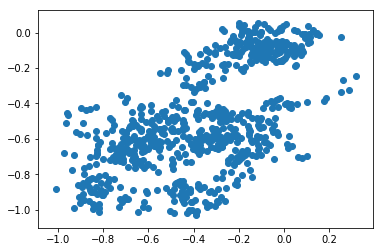

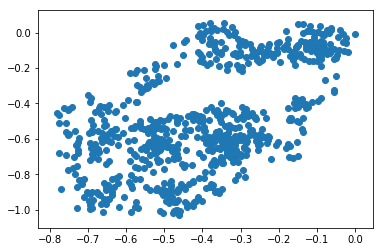

-3.6465993249788893


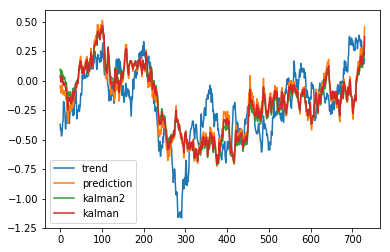

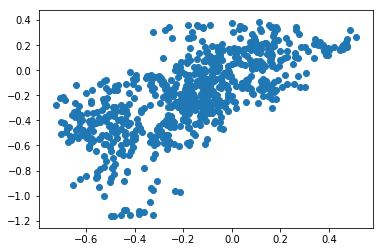

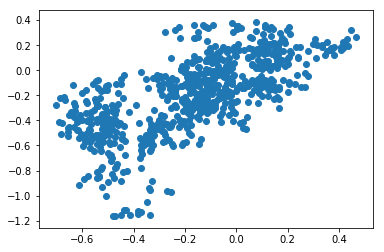

-3.646604558778928


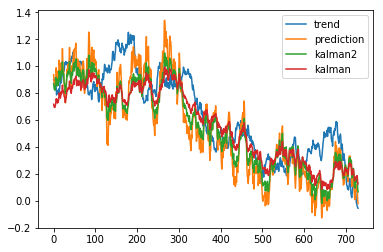

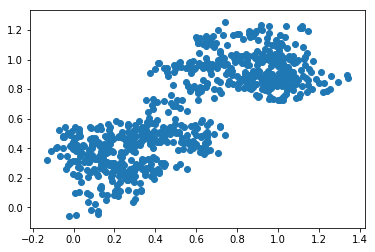

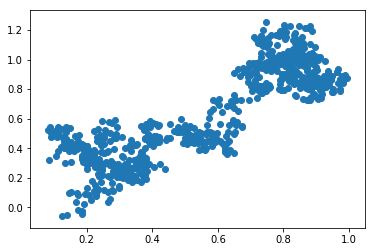

-3.6467020645272


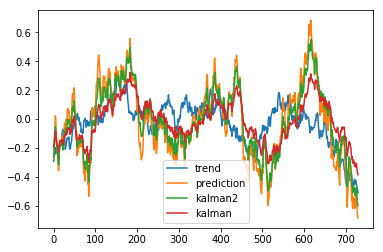

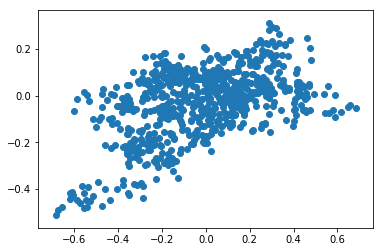

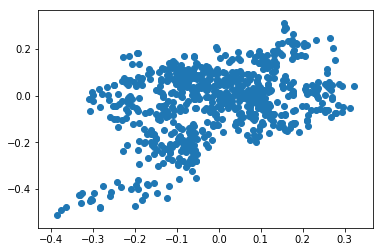

-3.6465840845834476


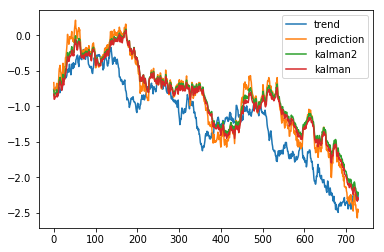

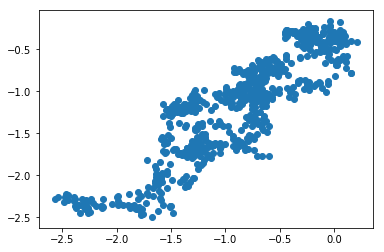

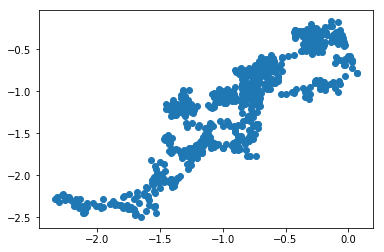

-3.6465589619241667


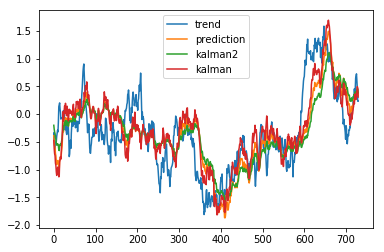

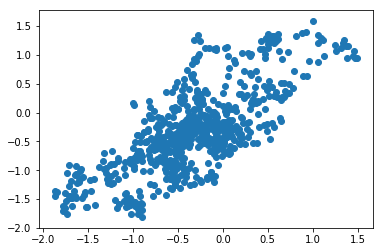

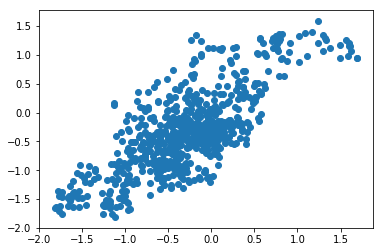

-3.646562205255033


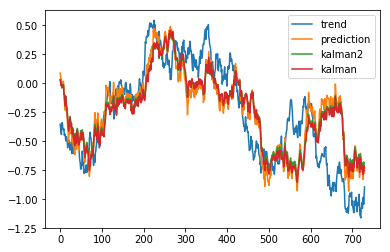

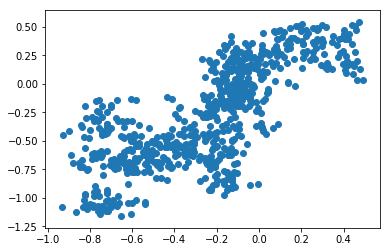

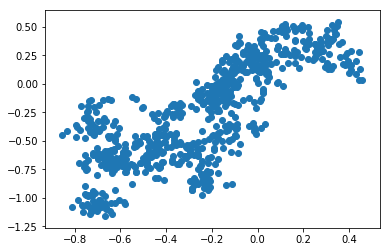

-3.6465749992989016


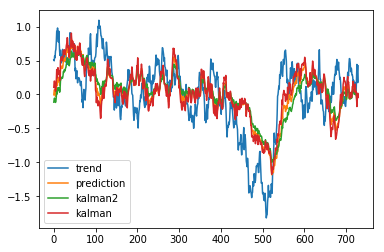

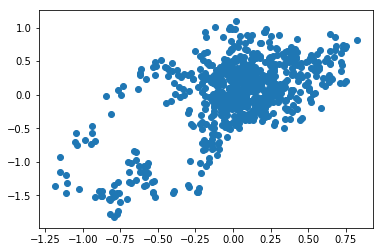

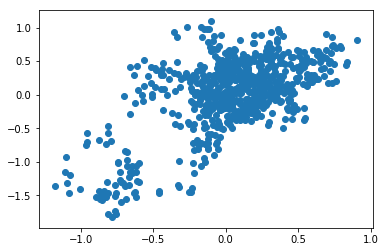

-3.6463553880807025


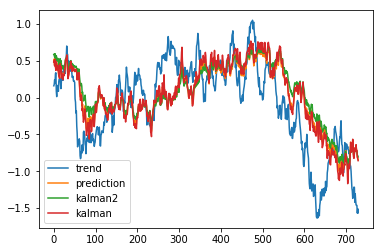

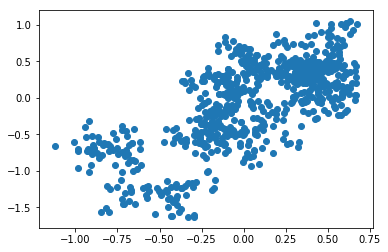

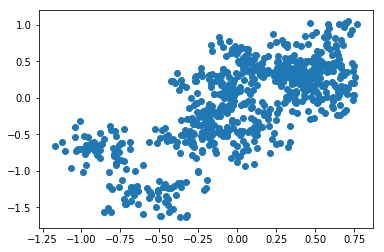

-3.646663162717597


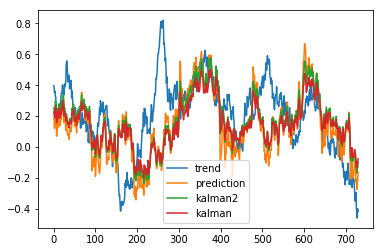

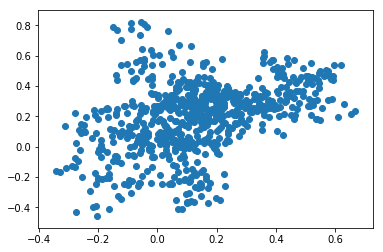

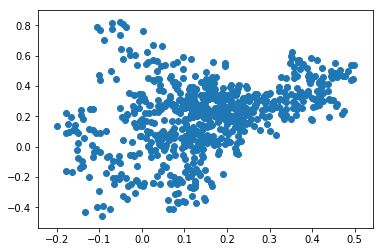

-3.6464967702981097


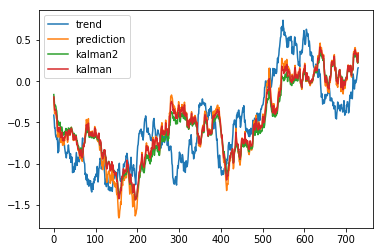

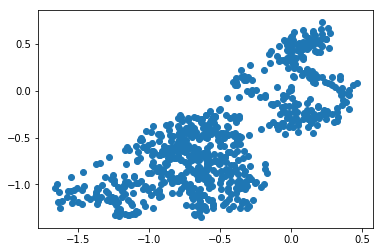

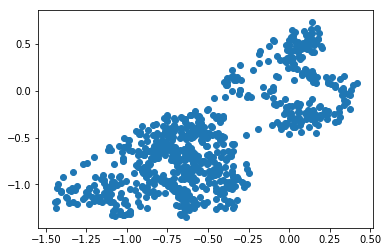

-3.6464892440475536


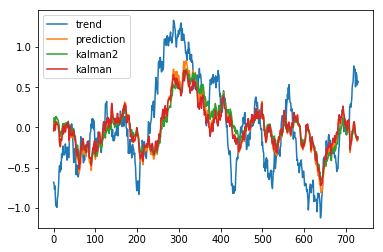

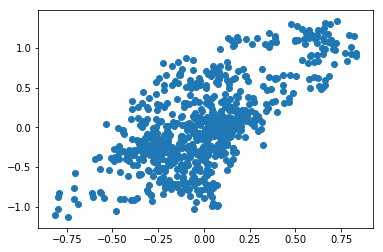

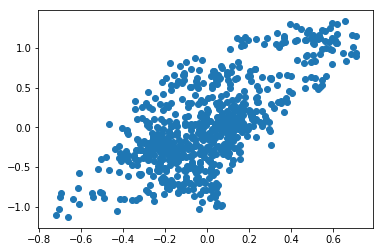

-3.6466759027447564


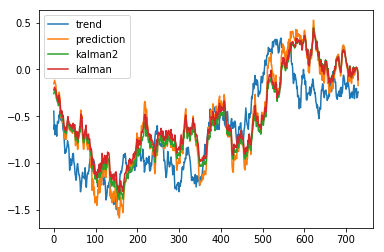

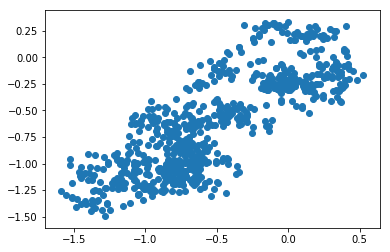

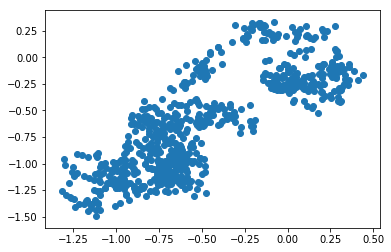

-3.646674338122831


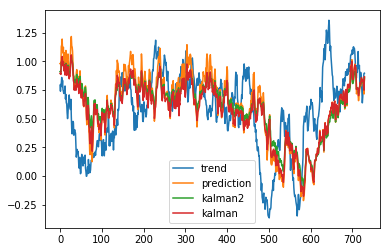

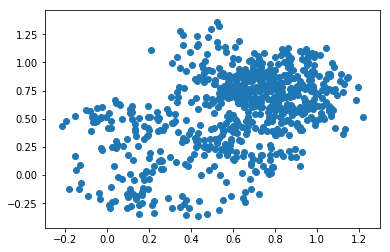

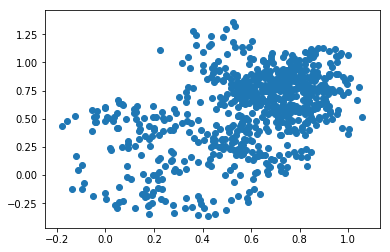

-3.6464701607823384


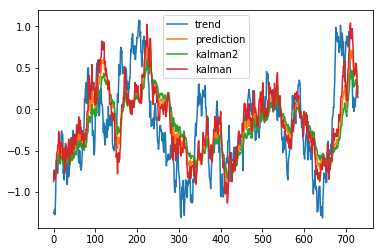

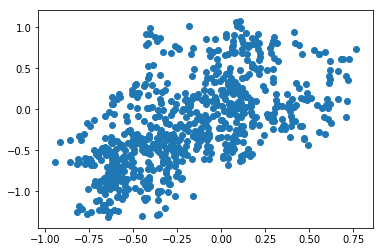

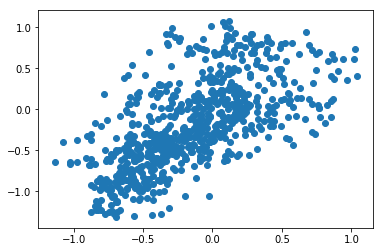

-3.6464994145557297


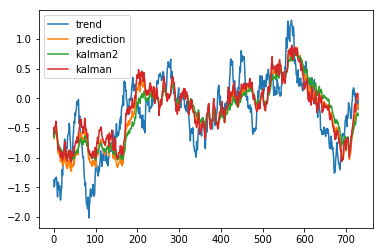

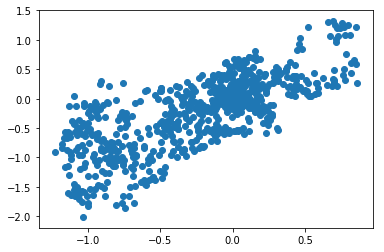

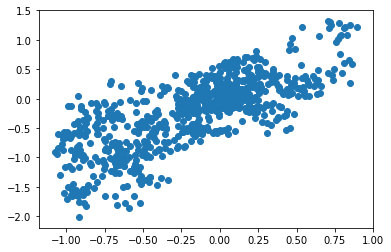

-3.646704497141765


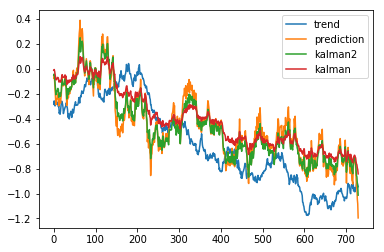

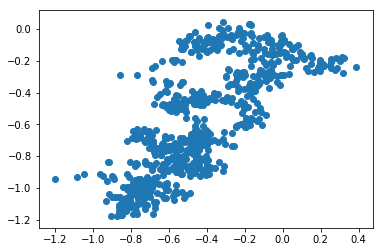

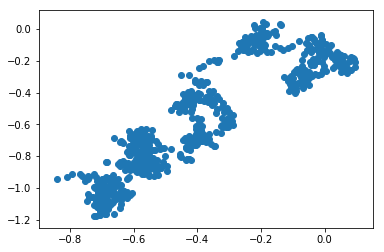

-3.6466818999964756


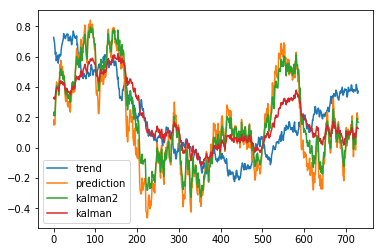

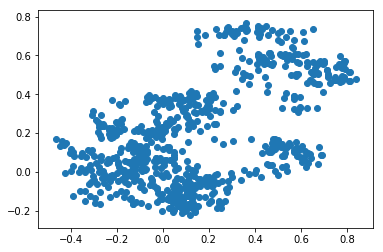

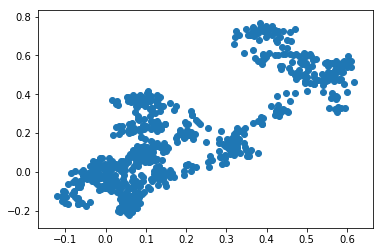

In [11]:
writer = tf.summary.FileWriter(logs_dir, graph)
lrate = 0.001
with tf.Session(graph=graph) as sess:
    sess.run(tf.global_variables_initializer())
    for i in range(3000):
        X,Y ,trends, dicti= next(generator)
        state = sess.run( initial_state)
        variables =tf.trainable_variables()
        if i==1500:
            lrate /= 3.
        
        if i==2250:
            lrate /= 3.
        feed = { inputs_: X,
                initial_state :state,
               targets_: Y ,
               learning_rate: lrate,
               grad_clip: 0.1}
        if (i+1) %100 == 0 :
            result = sess.run( [cost, outputs], feed_dict=feed)
            print( result[0]-noise**2)
            plt.plot( trends[1:,0][start:], label='trend')
            plt.plot( result[1][0,:,0][start:] , label='prediction')

            index=0
            lbd = 1
            sigma = 0.9
            sigmaS= 0.1
            deltaT= 1./365
            kalman_result =  kalman.kalman_estimate( X[index, :,0] ,
                                             sigmaS =sigmaS ,
                                             lbd=lbd,
                                             sigmamu= sigma,
                                             deltaT=deltaT )
            plt.plot(kalman_result[start:], label='kalman2' )

            kalman_result =  kalman.kalman_estimate( X[0, :,0] ,
                                                    sigmaS =noise/np.sqrt(365.) ,
                                                    lbd=dicti['lbd'],
                                                    sigmamu= dicti['sigma'],
                                                    deltaT=dicti['deltaT'] )
            plt.plot(kalman_result[start:], label='kalman' )
            plt.legend( loc='best')
            plt.show()
            plt.scatter( result[1][0,start:,0], trends[1:,0][start:])
            plt.show()
            plt.scatter( kalman_result[start:], trends[1:,0][start:])
            plt.show()
        sess.run( [optimizer], feed_dict=feed)
        ## print result
    for i in range(100):
        X,Y ,trends, dicti= next(generator)
        state = sess.run( initial_state)
        feed = { inputs_: X,
                initial_state :state,
               targets_: Y ,
               learning_rate: 0.001,
               grad_clip: 0.1}
        if i> -1 :
            result = sess.run( [cost, outputs], feed_dict=feed)
            print( result[0]-noise**2)
            plt.plot( trends[1:,0][start:], label='trend')
            plt.plot( result[1][0,:,0][start:] , label='prediction')

            index=0
            lbd = 1
            sigma = 0.9
            sigmaS= 0.1
            deltaT= 1./365
            kalman_result =  kalman.kalman_estimate( X[index, :,0] ,
                                             sigmaS =sigmaS ,
                                             lbd=lbd,
                                             sigmamu= sigma,
                                             deltaT=deltaT )
            plt.plot(kalman_result[start:], label='kalman2' )

            kalman_result =  kalman.kalman_estimate( X[0, :,0] ,
                                                    sigmaS =noise/np.sqrt(365.) ,
                                                    lbd=dicti['lbd'],
                                                    sigmamu= dicti['sigma'],
                                                    deltaT=dicti['deltaT'] )
            plt.plot(kalman_result[start:], label='kalman' )
            plt.legend( loc='best')
            plt.show()
            plt.scatter( result[1][0,start:,0], trends[1:,0][start:])
            plt.show()
            plt.scatter( kalman_result[start:], trends[1:,0][start:])
            plt.show()
        

writer.close()   

In [12]:
len(kalman_result[start:])

730

In [13]:
dicti

{'T': 3,
 'deltaT': 0.0027397260273972603,
 'lbd': 0.5623413251903491,
 'sigma': 0.366327617344939}

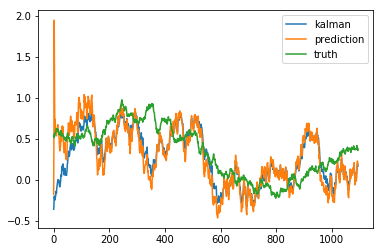

In [14]:
index=0
lbd = 1
sigma = 0.9
sigmaS= 0.1
deltaT= 1./365
kalman_result =  kalman.kalman_estimate( X[index, :,0] ,
                                 sigmaS =sigmaS ,
                                 lbd=lbd,
                                 sigmamu= sigma,
                                 deltaT=deltaT )
plt.plot(kalman_result, label='kalman' )
#plt.plot(X[index,:,0])
plt.plot( result[1][index,:,0] , label = 'prediction')
plt.plot( trends[1:,0] , label= 'truth')
plt.legend( loc='best')
plt.show()

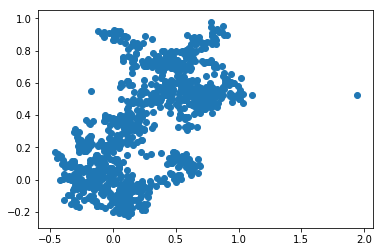

In [15]:
plt.scatter( result[1][0,:,0], trends[1:,0])
plt.show()

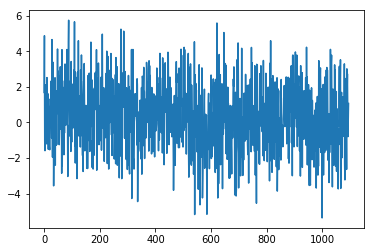

In [16]:
plt.plot(Y[0,:,0])
plt.show()